As a consultant for Olist (online solution for marketplaces),
we are commissioned to segment their client database. <br>
The goal is to establish a base for their communication campaigns. <br> 
They also require a maintenance contract based on a stability analysis of the different segments over time.

pd.show_versions() <br>
pandas version : 1.0.5 <br>
numpy version : 1.18.5 <br>
seaborn version : 0.11.2 <br>
matplotlib version : 3.2.2 <br>

This is the exploratory analysis of the project <br>
<a href='#Full'> Full description of the database and missing data </a> <br>
Part 1 - Cleaning and preparation of the database </a> <br>
$\;\;\;\;\;\;$ <a href='#Remove'> Removal of all the untreated orders </a> <br>
$\;\;\;\;\;\;$ <a href='#Fill'> Filling the na()s </a> <br>
$\;\;\;\;\;\;$ <a href='#Out'> Outliers </a> <br>
Part 2 - Feature Engineering and Data analysis </a> <br>
$\;\;\;\;\;\;$ <a href='#Time'> Time of purchase of the concerned order </a> <br>
$\;\;\;\;\;\;$ <a href='#Time'> Number of purchase, time of the first and last order a customer + recency and frequency </a> <br>
$\;\;\;\;\;\;$ <a href='#Time'> Time of purchase of the concerned order </a> <br>
$\;\;\;\;\;\;$ <a href='#Total'> Total spent for one order </a> <br>
$\;\;\;\;\;\;$ <a href='#FullTotal'> Total spent by a customer </a> <br>
$\;\;\;\;\;\;$ <a href='#Satisfaction'> Satisfaction of the customer </a> <br>
$\;\;\;\;\;\;$ <a href='#Delivery'> Delivery time </a> <br>
$\;\;\;\;\;\;$ <a href='#Distance'> Distance </a> <br>
$\;\;\;\;\;\;$ <a href='#category'> Most used categories </a> <br>
$\;\;\;\;\;\;$ <a href='#artic'> Number of articles and mean spending </a> <br>
$\;\;\;\;\;\;$ <a href='#pref'> Prefered method of payment </a> <br>
$\;\;\;\;\;\;$ <a href='#one'> One hot encoding of the categories by hand and prefered categories </a> <br>
Part 3 - Selected criterium <br>
$\;\;\;\;\;\;$ <a href='#finance'> Financial criterium <br>
$\;\;\;\;\;\;$ <a href='#categ'> Categories <br>
$\;\;\;\;\;\;$ <a href='#satis'> Satisfaction criterium <br>
$\;\;\;\;\;\;$ <a href='#acess'> Accessibility criterium <br>
$\;\;\;\;\;\;$ <a href='#pay'> Means of payment

#### Usual imports and options

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
# col width
pd.set_option('max_colwidth', 120)
# option to be able see all columns
pd.set_option('max_columns', None)
# max lanes display
pd.options.display.max_rows = 5000

In [7]:
import time
from datetime import date, datetime

In [8]:
from sklearn import preprocessing
from sklearn import decomposition

In [9]:
import plotly.express as px

In [58]:
# # Reloading
# start = time.time()
# dorder = pd.read_csv('dorder_clean10.csv')
# dorder.drop(['Unnamed: 0'], axis = 1, inplace=True)
# dorder.drop(['Unnamed: 69'], axis = 1, inplace=True)
# end = time.time()
# print("total time: ",(end - start),"sec")

total time:  1.443253755569458 sec


#### Functions

In [11]:
#pip install bioinfokit

In [12]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from bioinfokit.analys import stat

In [13]:
# Boxplot function + ANNOVA + STATS (p value for the whole and 2 by 2)
# df : name of the dataframe
# x is the name of the qualitative column (example : 'category')
# y is the name of the quantitative column (example : 'value')
# Tukey = 1 (stats 2 by 2)
# showfliers on/off ; sort = 1 : sort the resulting boxplot

def boxplots(df, x, y, tukey=1, size=(8,6), showfliers=False, sort = 0) :

    dfnona = df[df[y].notna()]
    X = x # qualitative
    Y = y # quantitative

    if sort == 1 :
        modalites = sorted(dfnona[X].unique(), reverse=False)
    elif sort == 2 :
        modalites = sorted(dfnona[X].unique(), reverse=True)
    else :
        modalites = dfnona[X].unique()
        
    groupes = []
    for m in modalites:
        groupes.append(dfnona[dfnona[X]==m][Y])

    # Propriétés graphiques (pas très importantes)    
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
                'markerfacecolor':'firebrick'}

    fig, ax = plt.subplots(figsize=size)
    ax.set_title(str(x)+' / '+str(y), fontsize=16)
    ax.set_xlabel(y, fontsize=14)
    ax.set_ylabel(x, fontsize=14) 
    # medianpropsdict, default: None / The style of the median
    # meanpropsdict, default: None / The style of the mean
    # vertbool, default: True / If True, draws vertical boxes. If False, draw horizontal boxes.
    # patch_artistbool, default: False / If False produces boxes with the Line2D artist. Otherwise, with Patch artists.
    plt.boxplot(
        groupes,
        labels=modalites,
        showfliers=showfliers,
        medianprops=medianprops,
        vert=False,
        patch_artist=True,
        showmeans=True,
        meanprops=meanprops,
    )
    plt.show()
    plt.rcParams.update({"font.size" : 50})   
    
    df2 = df.melt(id_vars=[X], value_vars=[Y])
    df2.columns = ['catquali', 'attribut', 'value']
    
    # Ordinary Least Squares (OLS) model
    modelanova = ols('value ~ C(catquali)', data=df2).fit()
    anova_table = sm.stats.anova_lm(modelanova, typ=2)
    print(anova_table)
    
    # we will use bioinfokit (v1.0.3 or later) for performing tukey HSD test
    # #pip install bioinfokit
    # check documentation here https://github.com/reneshbedre/bioinfokit
    # perform multiple pairwise comparison (Tukey's HSD)
    # unequal sample size data, tukey_hsd uses Tukey-Kramer test
    if tukey == 1:
        res = stat()
        res.tukey_hsd(
            df=df2,
            res_var="value",
            xfac_var="catquali",
            anova_model="value ~ C(catquali)",
        )
        print(res.tukey_summary)

In [14]:
#Pivot table for two qualitative categories + fig
# df : name of the dataframe
# x is the name of the first qualitative column (example : 'category')
# y is the name of the second qualitative column (example : 'day')
# heat = 1 give the total count ; size of the figure

def qualiquali(df, x, y, piv=1, fig = 1, size = (15, 10), heat = 1, size2 = (8, 6)) :
    
    X = x
    Y = y

    cont = df[[X,Y]].pivot_table(
        index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total"
    )
    if piv == 1 :
        print(cont)
        
    if fig == 1 :
        plt.figure(figsize = size)
        sns.countplot(y= Y, hue= X, data=df);
        
    if heat == 1 :
        tx = cont.loc[:,["Total"]]
        ty = cont.loc[["Total"],:]
        n = len(df)
        indep = tx.dot(ty) / n

        plt.figure(figsize = size2)
        c = cont.fillna(0) # On remplace les valeurs nulles par 0
        measure = (c-indep)**2 / indep
        xi = measure.sum().sum()
        table = measure/xi
        #sns.heatmap(table.iloc[:-1,:-1],annot=c.iloc[:-1,:-1]) # add the numbers on the heatmap
        sns.heatmap(table.iloc[:-1,:-1])
        plt.show()

In [15]:
#Pivot table for two qualitative categories + fig
# df : name of the dataframe
# x is the name of the first qualitative column (example : 'category')
# y is the name of the second qualitative column (example : 'day')
# heat = 1 give the total count ; size of the figure

def qualiqualinorm(df, x, y, piv=1, fig = 1, poli = 2, heat = 1, size2 = (8, 6)) :
    
    X = x
    Y = y

    cont = df[[X,Y]].pivot_table(
        index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total"
    )
    if piv == 1 :
        print(cont)
        
    if fig == 1 :
        u = df[Y].unique()

        cola = []
        colb = []
        colc = []
 
        for i in range(len(u)) :
            guecko = df[df[Y].isin([u[i]])][X].value_counts()
            norma = lambda x: (x - min(x)) / (max(x) - min(x))
            gogo = guecko.transform(norma)    # apply the normalisation
    
            for y in range(len(gogo)) :
                a = u[i] # the unique category of Y selected
                b = gogo.index.tolist()[y]    # the unique category of X associated
                c = gogo.tolist()[y]    # value_counts
        
                cola.append(a)
                colb.append(b)
                colc.append(c)
    
        zipped = list(zip(cola, colb, colc))
        vcount = 'value_counts'
        dfs = pd.DataFrame(zipped, columns=[Y, X, vcount])
        #print(dfs)

        bsize = (len(u) * len(df[X].unique()))/4
        size = (20, bsize)
        plt.figure(figsize = size)
        sns.barplot(x=vcount, y=Y, hue=X, data=dfs)
        sns.set(font_scale = poli)
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        
    if heat == 1 :
        tx = cont.loc[:,["Total"]]
        ty = cont.loc[["Total"],:]
        n = len(df)
        indep = tx.dot(ty) / n

        plt.figure(figsize = size2)
        c = cont.fillna(0) # On remplace les valeurs nulles par 0
        measure = (c-indep)**2/indep
        xi = measure.sum().sum()
        table = measure/xi
        #sns.heatmap(table.iloc[:-1,:-1],annot=c.iloc[:-1,:-1]) # add the numbers on the heatmap
        sns.heatmap(table.iloc[:-1,:-1])
        plt.show()

In [16]:
# Scatter fig  + linear regression
# df : name of the dataframe
# cat1 is the name of the first quatitative column (example : 'amount')
# cat2 is the name of the second quatitative column (example : 'value')
# regl = 1 show the linear regression on the graph ; co = 1 show the coefficients of the regression

from sklearn import linear_model

def quantiquanti(df, cat1, cat2, regl = 0, co = 0) :
    
    X = cat1
    Y = cat2
    Z = df[[X, Y]].copy().dropna()

    reg = linear_model.LinearRegression()
    reg.fit(Z[[X]], Z[Y])
    rez = reg.predict(Z[[X]])
    
    if co == 1 :
        # Coefficient
        print('Coefficients: \n', reg.coef_)
        # The mean squared error
        print('Mean squared error: %.2f'% mean_squared_error(Z[X], Z[Y]))
        # Coefficient de détermination: 1 est la prédiction parfaite
        print('Coefficient of determination: %.2f' % r2_score(Z[X], Z[Y]))
    
    plt.scatter(Z[X], Z[Y],  color='blue')
    
    if regl == 1 :
        plt.plot(Z[X], rez, color='red', linewidth=1)
    
    plt.xlabel(X)
    plt.ylabel(Y)

    plt.show()

# Part 1 : Loading and merging the databases

#### Data upload

In [13]:
start = time.time()

# jupyter
d1 = pd.read_csv('olist_customers_dataset.csv')
d2 = pd.read_csv('olist_geolocation_dataset.csv')
d2b = pd.read_csv('d2_mean.csv') # average of the geo loc for each zip code
d3 = pd.read_csv('olist_order_items_dataset.csv')
d4 = pd.read_csv('olist_order_payments_dataset.csv')
d5 = pd.read_csv('olist_order_reviews_dataset.csv')
d6 = pd.read_csv('olist_orders_dataset.csv')
d7 = pd.read_csv('olist_products_dataset.csv')
d8 = pd.read_csv('olist_sellers_dataset.csv')
d9 = pd.read_csv('product_category_name_translation.csv')

# #Kaggle
# d1 = pd.read_csv('../input/brazilian-ecommerce/olist_customers_dataset.csv')
# d2 = pd.read_csv('../input/brazilian-ecommerce/olist_geolocation_dataset.csv')
# d2b = pd.read_csv('../input/d2mean/d2_mean.csv')
# d3 = pd.read_csv('../input/brazilian-ecommerce/olist_order_items_dataset.csv')
# d4 = pd.read_csv('../input/brazilian-ecommerce/olist_order_payments_dataset.csv')
# d5 = pd.read_csv('../input/brazilian-ecommerce/olist_order_reviews_dataset.csv')
# d6 = pd.read_csv('../input/brazilian-ecommerce/olist_orders_dataset.csv')
# d7 = pd.read_csv('../input/brazilian-ecommerce/olist_products_dataset.csv')
# d8 = pd.read_csv('../input/brazilian-ecommerce/olist_sellers_dataset.csv')
# d9 = pd.read_csv('../input/brazilian-ecommerce/product_category_name_translation.csv')

data = [0, d1, d2, d3, d4, d5, d6, d7, d8, d9]

end = time.time()
print("total time: ",(end - start),"sec")

total time:  1.4422187805175781 sec


### Preview of the DBs

In [14]:
d1.shape

(99441, 5)

In [15]:
d1.head(1)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP


In [16]:
d2.shape

(1000163, 5)

In [17]:
d2.head(1)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP


In [18]:
d3.shape

(112650, 7)

In [19]:
d3.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29


In [20]:
d4.shape

(103886, 5)

In [21]:
d4.head(1)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33


In [22]:
d5.shape

(99224, 7)

In [23]:
d5.head(1)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59


In [24]:
d6.shape

(99441, 8)

In [25]:
d6.head(1)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00


In [26]:
d7.shape

(32951, 9)

In [27]:
d7.head(1)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0


In [28]:
d8.shape

(3095, 4)

In [29]:
d8.head(1)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP


In [30]:
d9.shape

(71, 2)

In [31]:
d9.head(1)

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty


## Merging the DataBase

In [32]:
for i in range(len(data)-1) :
    print(i+1, list(data[i+1]))

1 ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']
2 ['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state']
3 ['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value']
4 ['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']
5 ['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']
6 ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
7 ['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']
8 ['seller_id', 'seller_zip_code_prefix', 'se

---------------
---------------
#### Matches
We can merge...
d1 and 6 avec with 'customer_id' <br>
3, 4, 5, 6 with 'order_id' <br>
7 et 9 with 'product_category_name' <br>
3 et 8 with 'seller_id' <br>
2 et 1,8, we need to be extra carreful on this one since we have client and customer version.

In the order : I = (3,4,5,6) / II = (1-2) / III = (8-2) / IV = (7-9) / V = I - II - III - IV 

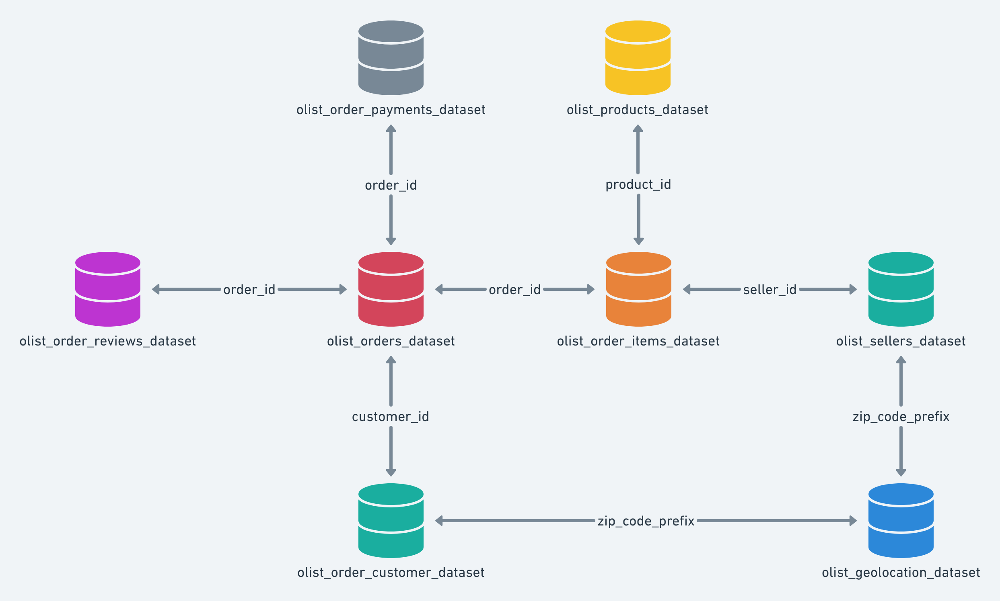

In [33]:
from IPython.display import Image
# notebook
Image("dbolist.png")

# # Kaggle
# Image('../input/picture-database/dbolist.png')

#### Client et customer

In [34]:
# I
# d3, d4, d5, d6

dorder = d3.copy()
order = [d4, d5, d6]

print(dorder.shape)
print('--'*5)

for i in range(len(order)) :
    dorder = dorder.merge(order[i], left_on = 'order_id',
                      right_on ='order_id',
                      how = 'outer')
    print(dorder.shape)
    print('--'*5)

(112650, 7)
----------
(118434, 11)
----------
(119143, 17)
----------
(119143, 24)
----------


#### comparaison between the "real" and the "mean" coordinates

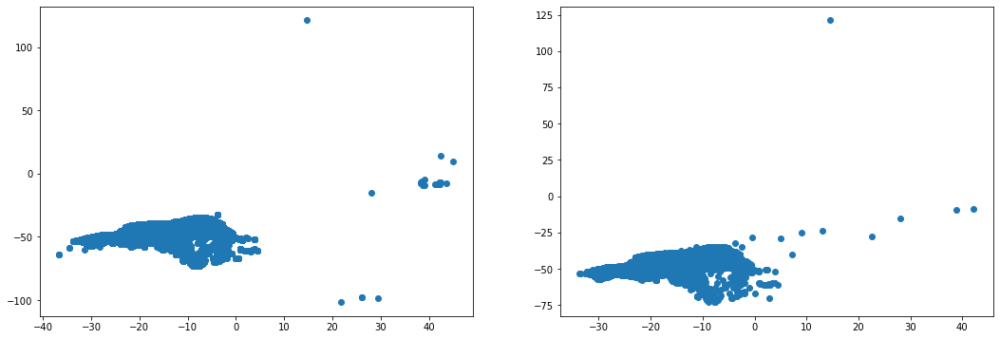

In [35]:
# this plot show the similarities between the original values of geoloc and the average ones.
fig = plt.figure(figsize=(18, 6))

ax = fig.add_subplot(121)
ax.plot(d2['geolocation_lat'], d2['geolocation_lng'], 'o')

ax = fig.add_subplot(122)
ax.plot(d2b['mean_lat'], d2b['mean_lng'], 'o')

In [36]:
# d2[d2['geolocation_zip_code_prefix'].isin([d2['geolocation_zip_code_prefix'].unique()[1]])]

In [37]:
# plt.plot(d2['geolocation_lat'][d2['geolocation_zip_code_prefix'].isin([d2['geolocation_zip_code_prefix'].unique()[1]])],
#          d2['geolocation_lng'][d2['geolocation_zip_code_prefix'].isin([d2['geolocation_zip_code_prefix'].unique()[1]])], 'o')

In [38]:
# plt.plot(d2['geolocation_lat'][d2['geolocation_zip_code_prefix'].isin([d2['geolocation_zip_code_prefix'].unique()[3]])],
#          d2['geolocation_lng'][d2['geolocation_zip_code_prefix'].isin([d2['geolocation_zip_code_prefix'].unique()[3]])], 'o')

In [39]:
#d2b.head()

In [40]:
#One for the customers / one for the sellers
d2_custo = d2b.copy()[['geolocation_zip_code_prefix', 'mean_lat', 'mean_lng']].rename(columns={
    'mean_lat' : 'geo_mlat_customer', 'mean_lng' : 'geo_mlng_customer'
                   })

In [41]:
d2_custo.shape

(19015, 3)

In [42]:
d2_custo.head(1)

,geolocation_zip_code_prefix,geo_mlat_customer,geo_mlng_customer
0,1037,-23.545411,-46.638924


In [43]:
# II -- left, on ne veut que les infos dont on a besoin
d12 = d1.merge(d2_custo, left_on = 'customer_zip_code_prefix',
                      right_on = 'geolocation_zip_code_prefix',
                      how = 'left')
print(d12.shape)

(99441, 8)


In [44]:
d12 = d12.drop(['geolocation_zip_code_prefix'], axis = 1)

In [45]:
d2_seller = d2b.copy()[['geolocation_zip_code_prefix', 'mean_lat', 'mean_lng']].rename(columns={
    'mean_lat' : 'geo_mlat_seller', 'mean_lng' : 'geo_mlng_seller'
                   })

In [46]:
d2_seller.shape

(19015, 3)

In [47]:
dorder.shape

(119143, 24)

In [48]:
# III
d82 = d8.merge(d2_seller, left_on = 'seller_zip_code_prefix',
                      right_on = 'geolocation_zip_code_prefix',
                      how = 'left')
print(d82.shape)

(3095, 7)


In [49]:
d82 = d82.drop(['geolocation_zip_code_prefix'], axis = 1)

In [50]:
dorder.shape

(119143, 24)

In [51]:
# IV
d79 = d7.merge(d9, left_on = 'product_category_name',
                      right_on = 'product_category_name',
                      how = 'outer')
print(d79.shape)

(32951, 10)


In [52]:
dorder.shape

(119143, 24)

In [53]:
# V - II
dorder = dorder.merge(d12, left_on = 'customer_id',
                      right_on = 'customer_id',
                      how = 'outer')

In [54]:
dorder.shape

(119143, 30)

In [55]:
# V - III
dorder = dorder.merge(d82, left_on = 'seller_id',
                      right_on = 'seller_id',
                      how = 'outer')

In [56]:
dorder.shape

(119143, 35)

In [57]:
# V - IV
dorder = dorder.merge(d79, left_on = 'product_id',
                      right_on = 'product_id',
                      how = 'outer')

In [58]:
dorder.shape

(119143, 44)

In [59]:
dorder.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
1,130898c0987d1801452a8ed92a670612,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,1.0,boleto,1.0,73.86,b11cba360bbe71410c291b764753d37f,5.0,NaN,"lannister como sempre, entregou certinho e dentro do prazo. recomendo muito",2017-07-14 00:00:00,2017-07-17 12:50:07,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO,-17.884337,-51.716990,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
2,532ed5e14e24ae1f0d735b91524b98b9,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,1.0,credit_card,2.0,83.23,af01c4017c5ab46df6cc810e069e654a,4.0,super recomendo,carrinho muito bonito,2018-06-05 00:00:00,2018-06-06 21:41:12,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG,-19.914323,-43.975703,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff


#### dorder contains all the data of the different databases

<a id='Full' />

## Full description of the database and missing data

In [60]:
col1 = list(dorder)

details = pd.DataFrame(col1, columns = ['attributs'])

details["valeurs_manquantes"] = (dorder.isna().mean()*100).tolist()
details["type"] = dorder.dtypes.tolist()

In [61]:
details['Com'] = ['order unique identifier', 'sequential number identifying number of items included in the same order',
                  'product unique identifier', 'seller unique identifier',
                  'Shows the seller shipping limit date for handling the order over to the logistic partner', 'item price',
                  'item freight value item (if an order has more than one item the freight value is splitted between items)',
                  
                  'a customer may pay an order with more than one payment method. If he does so, a sequence will be created to accommodate all payments',
                  'method of payment chosen by the customer', 'number of installments chosen by the customer',
                  'transaction value',
                  
                  'unique review identifier',
                  'Note ranging from 1 to 5 given by the customer on a satisfaction survey', 
                  'Comment title from the review left by the customer, in Portuguese', 
                  'Comment message from the review left by the customer, in Portuguese', 
                  'Shows the date in which the satisfaction survey was sent to the customer',
                  'Shows satisfaction survey answer timestamp',
                  
                  'key to the orders dataset. Each order has a unique customer_id', 
                  'Reference to the order status (delivered, shipped, etc)', 'Shows the purchase timestamp',
                  'Shows the payment approval timestamp', 
                  'Shows the order posting timestamp. When it was handled to the logistic partner', 
                  'Shows the actual order delivery date to the customer', 
                  'Shows the estimated delivery date that was informed to customer at the purchase moment',
                  
                  'unique identifier of a customer', 'first five digits of customer zip code', 'customer city name',
                  'customer state', 'customer latitute', 'customer longitude',
                  
                  'first five digits of seller zip code', 'seller city name',
                  'seller state', 'seller latitute', 'seller longitude',
                  
                  'root category of product, in Portuguese', 'number of characters extracted from the product name',
                  'number of characters extracted from the product description', 'number of product published photos',
                  'product weight measured in grams', 'product length measured in centimeters', 
                  'product height measured in centimeters', 'product width measured in centimeters', 'category name in English'
                 ]

In [62]:
left_aligned_details = details.style.set_properties(**{'text-align': 'left'}) 
left_aligned_details

,attributs,valeurs_manquantes,type,Com
0,order_id,0.000000,object,order unique identifier
1,order_item_id,0.699160,float64,sequential number identifying number of items included in the same order
2,product_id,0.699160,object,product unique identifier
3,seller_id,0.699160,object,seller unique identifier
4,shipping_limit_date,0.699160,object,Shows the seller shipping limit date for handling the order over to the logistic partner
5,price,0.699160,float64,item price
6,freight_value,0.699160,float64,item freight value item (if an order has more than one item the freight value is splitted between items)
7,payment_sequential,0.002518,float64,"a customer may pay an order with more than one payment method. If he does so, a sequence will be created to accommodate all payments"
8,payment_type,0.002518,object,method of payment chosen by the customer
9,payment_installments,0.002518,float64,number of installments chosen by the customer


In [63]:
len(dorder['product_category_name_english'].unique())

72

In [64]:
dorder.describe()

,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,customer_zip_code_prefix,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,geo_mlat_seller,geo_mlng_seller,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,118310.000000,118310.000000,118310.000000,119140.000000,119140.000000,119140.000000,118146.000000,119143.000000,118821.000000,118821.000000,118310.000000,118045.000000,118045.000000,116601.000000,116601.000000,116601.000000,118290.000000,118290.000000,118290.000000,118290.000000
mean,1.196543,120.646603,20.032387,1.094737,2.941246,172.735135,4.015582,35033.451298,-21.230187,-46.191214,24442.410413,-22.795042,-47.238176,48.767498,785.967822,2.205161,2112.250740,30.265145,16.619706,23.074799
std,0.699489,184.109691,15.836850,0.730141,2.777848,267.776077,1.400436,29823.198969,5.564179,4.042785,27573.004511,2.690838,2.339804,10.033540,652.584121,1.717452,3786.695111,16.189367,13.453584,11.749139
min,1.000000,0.850000,0.000000,1.000000,0.000000,0.000000,1.000000,1003.000000,-33.689948,-72.668881,1001.000000,-32.079231,-67.813284,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,1.000000,39.900000,13.080000,1.000000,1.000000,60.850000,4.000000,11250.000000,-23.589488,-48.097776,6429.000000,-23.606344,-48.829744,42.000000,346.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,1.000000,74.900000,16.280000,1.000000,2.000000,108.160000,5.000000,24240.000000,-22.928413,-46.631239,13660.000000,-23.425556,-46.750602,52.000000,600.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,1.000000,134.900000,21.180000,1.000000,4.000000,189.240000,5.000000,58475.000000,-20.180863,-43.608100,27972.000000,-21.757321,-46.518679,57.000000,983.000000,3.000000,1800.000000,38.000000,20.000000,30.000000
max,21.000000,6735.000000,409.680000,29.000000,24.000000,13664.080000,5.000000,99990.000000,42.184003,-8.723762,99730.000000,-2.501242,-34.855616,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [65]:
dorder.duplicated().sum()

0

# Part 1 - Cleaning and preparation of the database

<a id='Remove' />

## Removal of all the untreated orders

In [66]:
#focus on other categories like canceled could also be of use
orders = dorder['order_status'].unique()
orders

array(['delivered', 'shipped', 'invoiced', 'processing', 'canceled',
       'unavailable', 'approved', 'created'], dtype=object)

In [67]:
dorder[dorder['order_status'].isin(['shipped'])].head(2)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
17,bf3b217e5505e5e9d746120dbb93b562,1.0,ec02a5d380128f7a188e9ce8f3ddd832,48436dade18ac8b2bce089ec2a041202,2017-08-30 07:25:13,132.9,18.18,1.0,credit_card,4.0,151.08,ad04c464738a477312422d0f3af40ddb,1.0,NaN,"Não posso dizer que gostei dessa loja ou que recomendaria ela pra um amigo, sendo que o meu pedido não chegou no pra...",2017-09-20 00:00:00,2017-09-22 15:40:19,0669f5398348b7260f7f14411736e78f,shipped,2017-08-24 07:15:30,2017-08-24 07:25:13,2017-08-28 18:32:49,NaN,2017-09-18 00:00:00,cef403f888f6bb14ec10e4e02e410893,6874,itapecerica da serra,SP,-23.762546,-46.844182,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,59.0,599.0,2.0,2275.0,45.0,25.0,18.0,cool_stuff
207,088683f795a3d30bfd61152c4fabdfb2,1.0,86742dc5c815f1c8c04c6e323e3c1865,dd7ddc04e1b6c2c614352b383efe2d36,2017-07-20 02:25:54,29.9,16.92,1.0,boleto,1.0,46.82,903db4bec5b321c64960b1fba1fe0b1b,1.0,NaN,NaN,2017-08-17 00:00:00,2017-08-17 13:02:46,58d89fd1f863819ff9b040734f7bd7c6,shipped,2017-07-13 10:02:47,2017-07-14 02:25:54,2017-07-20 20:02:58,NaN,2017-08-14 00:00:00,748d25636bb96e15d9919877f9b9095d,78138,varzea grande,MT,-15.653621,-56.161005,3471.0,sao paulo,SP,-23.565096,-46.518565,pet_shop,37.0,734.0,10.0,6950.0,48.0,28.0,31.0,pet_shop


In [68]:
for i in range(len(orders)) :
    print(str(orders[i]), len(dorder[dorder['order_status'].isin([orders[i]])]))

delivered 115723
shipped 1256
invoiced 378
processing 376
canceled 750
unavailable 652
approved 3
created 5


In [69]:
print(dorder.shape)

#Removing invoiced, processing, canceled, unavailable, created
removes = ['invoiced', 'processing', 'canceled', 'unavailable', 'approved', 'created']

dorder = dorder.drop(dorder[dorder['order_status'].isin(removes)].index, axis=0).reset_index(drop=True)

print(dorder.shape)

(119143, 44)
(116979, 44)


<a id='Fill' />

## Filling the na()s

In [70]:
dorder.isna().mean()*100

order_id                          0.000000
order_item_id                     0.000855
product_id                        0.000855
seller_id                         0.000855
shipping_limit_date               0.000855
price                             0.000855
freight_value                     0.000855
payment_sequential                0.002565
payment_type                      0.002565
payment_installments              0.002565
payment_value                     0.002565
review_id                         0.811257
review_score                      0.811257
review_comment_title             88.255157
review_comment_message           58.275417
review_creation_date              0.811257
review_answer_timestamp           0.811257
customer_id                       0.000000
order_status                      0.000000
order_purchase_timestamp          0.000000
order_approved_at                 0.012823
order_delivered_carrier_date      0.001710
order_delivered_customer_date     1.080536
order_estim

In [71]:
# 0.000855% is equivalent to 1 lane with NaN
0.000855 * dorder.shape[0] / 100

1.00017045

In [72]:
dorder[dorder['order_item_id'].isin([np.nan])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
116978,a68ce1686d536ca72bd2dadc4b8671e5,NaN,NaN,NaN,NaN,NaN,NaN,1.0,boleto,1.0,77.73,b399a4b417fc794a814ef957423bd67a,1.0,NaN,Comprei o produto dia 06/10/2016 hj é 15/12/2016 SENDO QUE ERA 38 DIAS DE ENTREGA JÁ FAZEM MAIS DE 60 DIAS E NADA NÃ...,2016-12-07 00:00:00,2016-12-15 19:57:06,d7bed5fac093a4136216072abaf599d5,shipped,2016-10-05 01:47:40,2016-10-07 03:11:22,2016-11-07 16:37:37,NaN,2016-12-01 00:00:00,f15a952dfc52308d0361288fbf42c7b3,91250,porto alegre,RS,-30.02263,-51.105052,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
dorder[dorder['order_id'].isin(['a68ce1686d536ca72bd2dadc4b8671e5'])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
116978,a68ce1686d536ca72bd2dadc4b8671e5,NaN,NaN,NaN,NaN,NaN,NaN,1.0,boleto,1.0,77.73,b399a4b417fc794a814ef957423bd67a,1.0,NaN,Comprei o produto dia 06/10/2016 hj é 15/12/2016 SENDO QUE ERA 38 DIAS DE ENTREGA JÁ FAZEM MAIS DE 60 DIAS E NADA NÃ...,2016-12-07 00:00:00,2016-12-15 19:57:06,d7bed5fac093a4136216072abaf599d5,shipped,2016-10-05 01:47:40,2016-10-07 03:11:22,2016-11-07 16:37:37,NaN,2016-12-01 00:00:00,f15a952dfc52308d0361288fbf42c7b3,91250,porto alegre,RS,-30.02263,-51.105052,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
dorder.dropna(subset=['order_item_id'], inplace = True)

#### One lane removed due to a lack of info
---------------

In [75]:
dorder.isna().mean()*100

order_id                          0.000000
order_item_id                     0.000000
product_id                        0.000000
seller_id                         0.000000
shipping_limit_date               0.000000
price                             0.000000
freight_value                     0.000000
payment_sequential                0.002565
payment_type                      0.002565
payment_installments              0.002565
payment_value                     0.002565
review_id                         0.811264
review_score                      0.811264
review_comment_title             88.255057
review_comment_message           58.275915
review_creation_date              0.811264
review_answer_timestamp           0.811264
customer_id                       0.000000
order_status                      0.000000
order_purchase_timestamp          0.000000
order_approved_at                 0.012823
order_delivered_carrier_date      0.001710
order_delivered_customer_date     1.079690
order_estim

In [76]:
dorder[dorder['payment_type'].isin([np.nan])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
96650,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,NaN,NaN,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,NaN,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96651,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,NaN,NaN,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,NaN,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96652,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,NaN,NaN,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,NaN,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty


#### Unknown, None or 0 when it is not detrimental

In [77]:
dorder.loc[dorder['payment_type'].isna(), 'payment_type'] = 'Unknown'

In [78]:
dorder.loc[dorder['review_comment_title'].isna(), 'review_comment_title'] = 'Unknown'

In [79]:
dorder.loc[dorder['payment_sequential'].isna(), 'payment_sequential'] = 0

In [80]:
dorder.loc[dorder['review_comment_message'].isna(), 'review_comment_message'] = 'None'

In [81]:
dorder[dorder['payment_value'].isin([np.nan])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
96650,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96651,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96652,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty


In [82]:
dorder[dorder['order_id'].isin(['bfbd0f9bdef84302105ad712db648a6c'])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
96650,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96651,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty
96652,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,0.0,Unknown,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1.0,Unknown,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,-20.585751,-47.863693,81810.0,curitiba,PR,-25.507014,-49.275963,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty


In [83]:
rep = dorder[dorder['order_id'].isin(['bfbd0f9bdef84302105ad712db648a6c'])].index.tolist()
rep

[96650, 96651, 96652]

In [84]:
# FIlling the missing 'the very importanttttt' "payment_value"
dorder.loc[rep]['payment_value'] = (44.99+2.83)*3

In [85]:
#dorder.isna().mean()*100

In [86]:
dorder_price = dorder[['customer_unique_id', 'order_id', 'order_item_id', 'product_id', 'price', 'freight_value',
                       'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']]

In [87]:
dorder_price[dorder_price['payment_value'].isin([np.nan])]

,customer_unique_id,order_id,order_item_id,product_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
96650,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96651,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96652,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN


In [88]:
dorder_price[dorder_price['payment_sequential'].isin([0])]

,customer_unique_id,order_id,order_item_id,product_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
96650,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96651,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96652,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN


In [89]:
dorder_price[dorder_price['customer_unique_id'].isin(['830d5b7aaa3b6f1e9ad63703bec97d23'])]

,customer_unique_id,order_id,order_item_id,product_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
96650,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96651,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN
96652,830d5b7aaa3b6f1e9ad63703bec97d23,bfbd0f9bdef84302105ad712db648a6c,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,0.0,Unknown,NaN,NaN


#### Could be either be removed or replaced by hand

In [90]:
removed = dorder_price[dorder_price['customer_unique_id'].isin(['830d5b7aaa3b6f1e9ad63703bec97d23'])].index
removed

Int64Index([96650, 96651, 96652], dtype='int64')

In [91]:
dorder = dorder.drop(removed, axis=0).reset_index(drop=True)

The left Nans could be replaced by hand or using mean value (ex : mean value of the product category or product review score), but most of these won't be used in the next part. 

End of the filling...

<a id='Out' />

## Outliers

no negative price, freight_value, etc, etc <br>
min payment_value = 0 <br>
there are few "extreme" values in the payment value, price or recency as we will see in the next section

In [92]:
dorder[dorder['payment_value'] == 0]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
2597,45ed6e85398a87c253db47c2d9f48216,1.0,75d6b6963340c6063f7f4cfcccfe6a30,cc419e0650a3c5ba77189a1882b7556a,2017-06-15 21:30:18,56.99,14.15,3.0,voucher,1.0,0.0,b59cf587845cad9af780a2f839ee6c30,1.0,Unknown,"Produto demorou a chegar e veio diferente do que foi pedido... pedi X veio Y, nada haver...",2017-06-23 00:00:00,2017-06-27 16:19:05,8eab8f9b3c744b76b65f7a2c0c8f2d6c,delivered,2017-06-08 21:18:45,2017-06-08 21:30:18,2017-06-09 08:35:18,2017-06-22 17:44:53,2017-07-10 00:00:00,e4000306cf2f63714e6bb70dd20a6592,74595,goiania,GO,-16.625932,-49.293377,9015.0,santo andre,SP,-23.659364,-46.523183,perfumaria,51.0,999.0,2.0,400.0,18.0,11.0,20.0,perfumery
36970,8bcbe01d44d147f901cd3192671144db,1.0,85d4c1a46f08f730de651ea6f6645313,3d871de0142ce09b7081e2b9d1733cb1,2018-01-30 23:37:20,59.00,15.16,4.0,voucher,1.0,0.0,3d42038fd2a7d35a88b93cb3e51796a3,4.0,Unknown,None,2018-02-03 00:00:00,2018-02-11 17:34:29,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00,cc5aa1b8337e394da54980226bb0f6d4,21040,rio de janeiro,RJ,-22.858267,-43.252692,13232.0,campo limpo paulista,SP,-23.211746,-46.762875,papelaria,50.0,113.0,3.0,500.0,20.0,30.0,20.0,stationery
66018,fa65dad1b0e818e3ccc5cb0e39231352,1.0,1aecdb5fa3add74e385f25c6c527a462,06532f10282704ef4c69168b914b77be,2017-04-27 09:10:13,392.55,65.44,14.0,voucher,1.0,0.0,f28281373ab8815bafafe371218f02ce,1.0,Unknown,A mercadoria não foi entregue. Entrara em contato no dia 22/05 e avisando que a mercadoria seria devolvida para cida...,2017-05-21 00:00:00,2017-05-24 16:21:27,9af2372a1e49340278e7c1ef8d749f34,shipped,2017-04-20 12:45:34,2017-04-22 09:10:13,2017-04-24 11:31:17,NaN,2017-05-18 00:00:00,8af7ac63b2efbcbd88e5b11505e8098a,78065,cuiaba,MT,-15.617234,-56.077693,87140.0,paincandu,PR,-23.456821,-52.039905,ferramentas_jardim,41.0,3544.0,1.0,16400.0,100.0,30.0,30.0,garden_tools
66027,fa65dad1b0e818e3ccc5cb0e39231352,1.0,1aecdb5fa3add74e385f25c6c527a462,06532f10282704ef4c69168b914b77be,2017-04-27 09:10:13,392.55,65.44,13.0,voucher,1.0,0.0,f28281373ab8815bafafe371218f02ce,1.0,Unknown,A mercadoria não foi entregue. Entrara em contato no dia 22/05 e avisando que a mercadoria seria devolvida para cida...,2017-05-21 00:00:00,2017-05-24 16:21:27,9af2372a1e49340278e7c1ef8d749f34,shipped,2017-04-20 12:45:34,2017-04-22 09:10:13,2017-04-24 11:31:17,NaN,2017-05-18 00:00:00,8af7ac63b2efbcbd88e5b11505e8098a,78065,cuiaba,MT,-15.617234,-56.077693,87140.0,paincandu,PR,-23.456821,-52.039905,ferramentas_jardim,41.0,3544.0,1.0,16400.0,100.0,30.0,30.0,garden_tools
79638,b23878b3e8eb4d25a158f57d96331b18,1.0,e306ca54c91b21392317d5b4632c9fe3,e49c26c3edfa46d227d5121a6b6e4d37,2017-06-01 19:35:17,135.30,36.27,4.0,voucher,1.0,0.0,f75bfd523e8001ea6c62f86c48fae8a9,5.0,Unknown,None,2017-06-08 00:00:00,2017-06-10 19:28:35,648121b599d98c420ef93f6135f8c80c,delivered,2017-05-27 19:20:24,2017-05-27 19:35:17,2017-05-29 04:49:37,2017-06-07 08:53:10,2017-06-29 00:00:00,9077449283dc1319d5e51fb3159b28e2,29230,anchieta,ES,-20.800378,-40.648850,55325.0,brejao,PE,-9.024839,-36.570200,consoles_games,42.0,778.0,1.0,700.0,26.0,12.0,18.0,consoles_games
116016,6ccb433e00daae1283ccc9561

In [93]:
dorder[dorder['order_id'] == '45ed6e85398a87c253db47c2d9f48216']

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
2595,45ed6e85398a87c253db47c2d9f48216,1.0,75d6b6963340c6063f7f4cfcccfe6a30,cc419e0650a3c5ba77189a1882b7556a,2017-06-15 21:30:18,56.99,14.15,2.0,voucher,1.0,50.01,b59cf587845cad9af780a2f839ee6c30,1.0,Unknown,"Produto demorou a chegar e veio diferente do que foi pedido... pedi X veio Y, nada haver...",2017-06-23 00:00:00,2017-06-27 16:19:05,8eab8f9b3c744b76b65f7a2c0c8f2d6c,delivered,2017-06-08 21:18:45,2017-06-08 21:30:18,2017-06-09 08:35:18,2017-06-22 17:44:53,2017-07-10 00:00:00,e4000306cf2f63714e6bb70dd20a6592,74595,goiania,GO,-16.625932,-49.293377,9015.0,santo andre,SP,-23.659364,-46.523183,perfumaria,51.0,999.0,2.0,400.0,18.0,11.0,20.0,perfumery
2596,45ed6e85398a87c253db47c2d9f48216,1.0,75d6b6963340c6063f7f4cfcccfe6a30,cc419e0650a3c5ba77189a1882b7556a,2017-06-15 21:30:18,56.99,14.15,1.0,voucher,1.0,21.13,b59cf587845cad9af780a2f839ee6c30,1.0,Unknown,"Produto demorou a chegar e veio diferente do que foi pedido... pedi X veio Y, nada haver...",2017-06-23 00:00:00,2017-06-27 16:19:05,8eab8f9b3c744b76b65f7a2c0c8f2d6c,delivered,2017-06-08 21:18:45,2017-06-08 21:30:18,2017-06-09 08:35:18,2017-06-22 17:44:53,2017-07-10 00:00:00,e4000306cf2f63714e6bb70dd20a6592,74595,goiania,GO,-16.625932,-49.293377,9015.0,santo andre,SP,-23.659364,-46.523183,perfumaria,51.0,999.0,2.0,400.0,18.0,11.0,20.0,perfumery
2597,45ed6e85398a87c253db47c2d9f48216,1.0,75d6b6963340c6063f7f4cfcccfe6a30,cc419e0650a3c5ba77189a1882b7556a,2017-06-15 21:30:18,56.99,14.15,3.0,voucher,1.0,0.00,b59cf587845cad9af780a2f839ee6c30,1.0,Unknown,"Produto demorou a chegar e veio diferente do que foi pedido... pedi X veio Y, nada haver...",2017-06-23 00:00:00,2017-06-27 16:19:05,8eab8f9b3c744b76b65f7a2c0c8f2d6c,delivered,2017-06-08 21:18:45,2017-06-08 21:30:18,2017-06-09 08:35:18,2017-06-22 17:44:53,2017-07-10 00:00:00,e4000306cf2f63714e6bb70dd20a6592,74595,goiania,GO,-16.625932,-49.293377,9015.0,santo andre,SP,-23.659364,-46.523183,perfumaria,51.0,999.0,2.0,400.0,18.0,11.0,20.0,perfumery


#### at the end the full amount have been paid via the two first payment sequential so we don't need to modify anything

In [94]:
startt = time.time()

dorder[dorder['order_id'] == '45ed6e85398a87c253db47c2d9f48216']

endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.019003868103027344 sec


In [95]:
startt = time.time()

dorder.loc[dorder['order_id'] == '45ed6e85398a87c253db47c2d9f48216']

endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.018002986907958984 sec


In [96]:
dorder[dorder['order_id'] == '8bcbe01d44d147f901cd3192671144db']

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
36969,8bcbe01d44d147f901cd3192671144db,1.0,85d4c1a46f08f730de651ea6f6645313,3d871de0142ce09b7081e2b9d1733cb1,2018-01-30 23:37:20,59.0,15.16,3.0,voucher,1.0,6.25,3d42038fd2a7d35a88b93cb3e51796a3,4.0,Unknown,None,2018-02-03 00:00:00,2018-02-11 17:34:29,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00,cc5aa1b8337e394da54980226bb0f6d4,21040,rio de janeiro,RJ,-22.858267,-43.252692,13232.0,campo limpo paulista,SP,-23.211746,-46.762875,papelaria,50.0,113.0,3.0,500.0,20.0,30.0,20.0,stationery
36970,8bcbe01d44d147f901cd3192671144db,1.0,85d4c1a46f08f730de651ea6f6645313,3d871de0142ce09b7081e2b9d1733cb1,2018-01-30 23:37:20,59.0,15.16,4.0,voucher,1.0,0.00,3d42038fd2a7d35a88b93cb3e51796a3,4.0,Unknown,None,2018-02-03 00:00:00,2018-02-11 17:34:29,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00,cc5aa1b8337e394da54980226bb0f6d4,21040,rio de janeiro,RJ,-22.858267,-43.252692,13232.0,campo limpo paulista,SP,-23.211746,-46.762875,papelaria,50.0,113.0,3.0,500.0,20.0,30.0,20.0,stationery
36971,8bcbe01d44d147f901cd3192671144db,1.0,85d4c1a46f08f730de651ea6f6645313,3d871de0142ce09b7081e2b9d1733cb1,2018-01-30 23:37:20,59.0,15.16,1.0,credit_card,1.0,36.21,3d42038fd2a7d35a88b93cb3e51796a3,4.0,Unknown,None,2018-02-03 00:00:00,2018-02-11 17:34:29,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00,cc5aa1b8337e394da54980226bb0f6d4,21040,rio de janeiro,RJ,-22.858267,-43.252692,13232.0,campo limpo paulista,SP,-23.211746,-46.762875,papelaria,50.0,113.0,3.0,500.0,20.0,30.0,20.0,stationery
36972,8bcbe01d44d147f901cd3192671144db,1.0,85d4c1a46f08f730de651ea6f6645313,3d871de0142ce09b7081e2b9d1733cb1,2018-01-30 23:37:20,59.0,15.16,2.0,voucher,1.0,31.70,3d42038fd2a7d35a88b93cb3e51796a3,4.0,Unknown,None,2018-02-03 00:00:00,2018-02-11 17:34:29,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00,cc5aa1b8337e394da54980226bb0f6d4,21040,rio de janeiro,RJ,-22.858267,-43.252692,13232.0,campo limpo paulista,SP,-23.211746,-46.762875,papelaria,50.0,113.0,3.0,500.0,20.0,30.0,20.0,stationery


#### Same case for all the order in this list

## Removing other specific rows

#### I have noticed some lanes that are currently showing strange values
For example (see next dataframe): <br>
payment_sequential with number 2 but without number 1 <br>
price + freight < payment_value (does they have an interest rate of some sort?) <br>
these unexplained behavior lead me to remove the 368 lines (until technical discussion with the society)

In [97]:
with open('index_to_remove.npy', 'rb') as f:
    index_to_remove = np.load(f)

In [98]:
len(index_to_remove)

368

In [99]:
dorder[['order_id', 'order_item_id', 'price', 'freight_value', 'payment_value', 'payment_sequential', 'payment_type', 
        'payment_installments', 'review_id', 'customer_unique_id']].loc[index_to_remove]

,order_id,order_item_id,price,freight_value,payment_value,payment_sequential,payment_type,payment_installments,review_id,customer_unique_id
489,442d76affff0114c57a8b5e3af634638,1.0,14.90,22.85,37.75,2.0,debit_card,1.0,d8adb134d952d32baf98b7426004b3af,9b51730fa415922803b46fe82216e75d
1488,e57d9d7eca079892fe0aee2b0cf96311,1.0,89.99,15.39,115.42,1.0,credit_card,10.0,cd06e24d33f2c756f67201135ff8908e,55b3654bd4275e492bdd9819db6b04f1
1722,debc12ca3f03ddd2137fa497916c4590,1.0,58.99,17.66,82.00,1.0,credit_card,5.0,71b2591d4afa5a893d1c990414336e40,fe856d7e322242cbfd59ab1cfcc78066
1755,fce3db7092e1f432d0ec790414b6a5e4,1.0,58.99,7.39,66.38,2.0,debit_card,1.0,bed9227c4306d8e608366f85a31d68a3,b0544deca1ad01a5e0f71db95378697f
1915,ab39f24d0e515ab82f849a72b61597d3,1.0,56.99,8.72,68.74,1.0,credit_card,3.0,43c2f13f09c638f739c79f0e75e7d751,6c8dc01cb0a463acab7cb860c167c78a
2368,ec3921c711c656d036c7316503867f69,1.0,19.99,14.52,36.10,1.0,credit_card,3.0,3138af474f191286070af56f2b1d5e51,f6e92840fbea6febf6662cbf9616ecbc
2500,931a32b4ca3fdc36741af29ea645d8bf,1.0,84.99,9.41,94.40,2.0,boleto,1.0,690a3bc092cc51f7c66ac8775072cb8b,c00aa9a5a9bf82a02e144e2f46f62bda
3139,8d9c0dc8d5a2ce804f6b925d8f8e6c1d,2.0,86.90,22.33,293.89,1.0,credit_card,12.0,7ca5ce17b6e618cc6b5f09b831224fa6,b44c3e3d672e8d4fa98b45abb3c38d66
3258,c5bb8cf75ccd20ee373200ab31628770,1.0,89.90,17.88,121.80,1.0,credit_card,10.0,893a13cb902fc302be0275805d7aa534,17c6652c9c8a71e905e388b9ede23d6c
3317,e4406088398131aed8c21c5a4ec3442b,1.0,89.90,13.65,109.55,1.0,credit_card,4.0,e227eaa3a180c7fa254458f34034a96f,0bcb0137639d8010c5fc562d96b4af3c


In [100]:
print(dorder.shape[0])
print('--'*5)
dorder.drop(index_to_remove).reset_index(inplace=True)
print(dorder.shape[0])

116975
----------
116975


In [101]:
#dorder.to_csv('dorder_clean_pre_fe.csv')

#### Another solution consist to calculate the total spent for one order in a different way (ie. payment_value)

# Part 2 - Feature Engineering and Data analysis

<a id='Time' />

### Time of  purchase of the concerned order

In [102]:
#from datetime to number of days

def trans_datetime(df) :

    startt = time.time()

    for i in range(df.shape[0]) :
        time_in_sec_from_Jan_1970 = datetime.timestamp(datetime.strptime(df.loc[i, 'order_purchase_timestamp'], "%Y-%m-%d %X"))
        time_in_sec_from_Jan_2016 = (time_in_sec_from_Jan_1970 - ((60 * 60 * 24)) * (35*(365)+11*(366))) #to avoid any loss of info (check the number of diggits)
        time_in_days_from_Jan_2016 = (time_in_sec_from_Jan_1970 / (60 * 60 * 24)) - (35*(365)+11*(366))
        df.loc[i, 'Time_of_purchase'] = time_in_days_from_Jan_2016
        df.loc[i, 'Time_of_purchase_sec'] = time_in_sec_from_Jan_2016

    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [103]:
trans_datetime(dorder)

total time:  46.913283348083496 sec


In [104]:
dorder.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0
1,130898c0987d1801452a8ed92a670612,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,1.0,boleto,1.0,73.86,b11cba360bbe71410c291b764753d37f,5.0,Unknown,"lannister como sempre, entregou certinho e dentro do prazo. recomendo muito",2017-07-14 00:00:00,2017-07-17 12:50:07,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO,-17.884337,-51.716990,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,544.411343,47037140.0
2,532ed5e14e24ae1f0d735b91524b98b9,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,1.0,credit_card,2.0,83.23,af01c4017c5ab46df6cc810e069e654a,4.0,super recomendo,carrinho muito bonito,2018-06-05 00:00:00,2018-06-06 21:41:12,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG,-19.914323,-43.975703,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,868.351308,75025553.0


In [105]:
#date of the last order of the dataframe :
last = max(dorder['order_purchase_timestamp'])
print(last)
print('--'*5)
lastnum = datetime.timestamp(datetime.strptime(last, "%Y-%m-%d %X"))
lastnum_year_2016 = (lastnum / (60 * 60 * 24)) - (35*(365)+11*(366))
print(lastnum_year_2016)

2018-09-03 09:06:57
----------
976.2964930555572


<a id='Number' />

### Number of purchase, time of the  first and last order a customer + recency and frequency

In [106]:
def numb_first_last_rec_freq(df) :
    startt = time.time()

    unicusto = df['customer_unique_id'].unique()

    df['Number_of_orders'] = 1
    df['First_order_time'] = 1
    df['Last_order_time'] = 1
    df['Recency'] = 1
    df['Frequency'] = 1

    for i in range(len(unicusto)) :
        coco = df[df['customer_unique_id'].isin([unicusto[i]])]
        lastcoco = max(coco['Time_of_purchase_sec'])
        firstcoco = min(coco['Time_of_purchase_sec'])
        indexcoco = coco.index.tolist()
        numb = len(coco['order_id'].unique())
    
        df['Number_of_orders'].loc[indexcoco] = numb
        df['First_order_time'].loc[indexcoco] = firstcoco
        df['Last_order_time'].loc[indexcoco] = lastcoco
        df['Recency'].loc[indexcoco] = (((lastnum_year_2016 * 24 * 60 *60) - lastcoco) / 60 / 60 / 24)
        if lastcoco != firstcoco :
            # in sec
            bob = (df.loc[[indexcoco][0]]['Number_of_orders']/((lastcoco - firstcoco)**(1/4)))
            df['Frequency'].loc[indexcoco] = bob
        
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [107]:
numb_first_last_rec_freq(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  1026.8868141174316 sec


In [108]:
# set the zero to zero
dorder['Recency'] = dorder['Recency'] - min(dorder['Recency'])

### Visualisation of numeric variables

In [109]:
colnumerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

dorder_nume = dorder.select_dtypes(include=colnumerics)
dorder_nume.head(1)

,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,customer_zip_code_prefix,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,geo_mlat_seller,geo_mlng_seller,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency
0,1.0,58.9,13.29,1.0,2.0,72.19,5.0,28013,-21.762775,-41.309633,27277.0,-22.496953,-44.127492,58.0,598.0,4.0,650.0,28.0,9.0,14.0,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0


In [110]:
dorder_nume.shape[1]

27

In [111]:
# dfn = dorder_nume
# dfnl = list(dfn)
# dfnll = len(dfnl)
# si = int(dfnll/2)

# fig, axes = plt.subplots(ncols=2, nrows=si, figsize=(20, dfnll*3))
# fig.subplots_adjust(wspace=0.3, hspace=0.6)

# nbins = 80
    
# for i, ax in zip(range(dfnll), axes.flat):

#     sns.histplot(data=dfn[dfnl[i]].dropna(), kde=False, bins=nbins, log_scale=(False, False), ax=ax)
#     plt.title(dfnl[i])

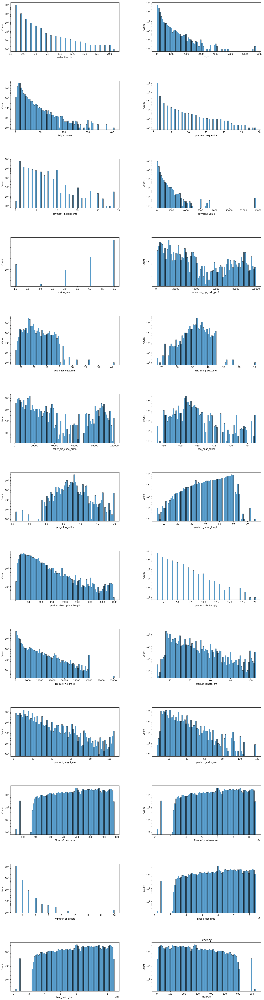

In [112]:
dfn = dorder_nume
dfnl = list(dfn)
dfnll = len(dfnl)
si = int(dfnll/2)

fig, axes = plt.subplots(ncols=2, nrows=si, figsize=(20, dfnll*3))
fig.subplots_adjust(wspace=0.3, hspace=0.6)

nbins = 80
    
for i, ax in zip(range(dfnll), axes.flat):

    sns.histplot(data=dfn[dfnl[i]].dropna(), kde=False, bins=nbins, log_scale=(False, True), ax=ax)
    plt.title(dfnl[i])

In [113]:
dfn['Frequency'].describe()

count    116975.000000
mean          0.961681
std           0.235955
min           0.023483
25%           1.000000
50%           1.000000
75%           1.000000
max           3.000000
Name: Frequency, dtype: float64

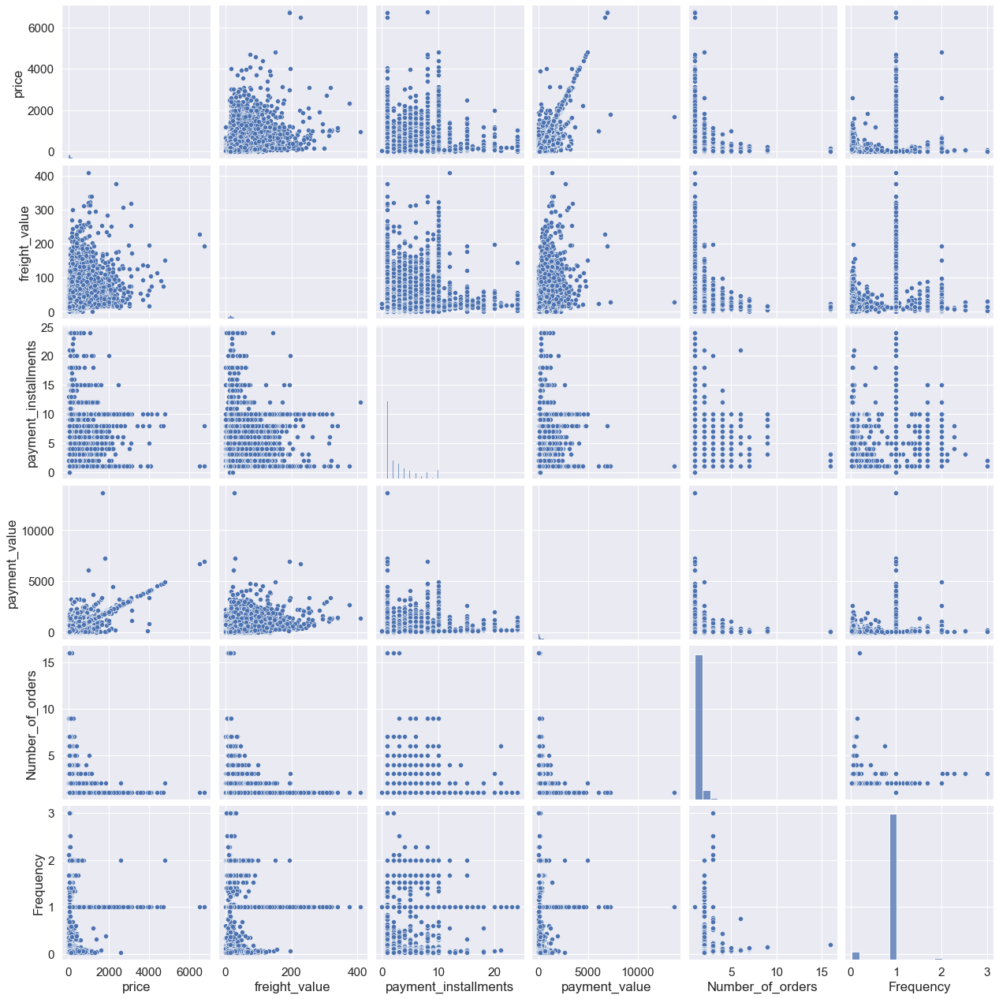

In [114]:
dfnp = dorder_nume[['price', 'freight_value', 'payment_installments',
                    'payment_value', 'Number_of_orders', 'Frequency']]
sns.set(font_scale = 1.4)
sns.pairplot(dfnp, height=3)

In [115]:
dorder_p = dorder[['order_id', 'order_item_id', 'product_id', 'price', 'freight_value', 'payment_installments',
                   'payment_value', 'payment_sequential', 'payment_type']]

In [116]:
ident = 'c9ef97d2854afe64a3b4488bc2836af6'
dorder_p[dorder_p['order_id'].isin([ident])]

,order_id,order_item_id,product_id,price,freight_value,payment_installments,payment_value,payment_sequential,payment_type
7,c9ef97d2854afe64a3b4488bc2836af6,2.0,4244733e06e7ecb4970a6e2683c13e61,58.9,18.12,1.0,153.75,1.0,boleto
12,c9ef97d2854afe64a3b4488bc2836af6,1.0,436c8d57ff8d4aa254318e9bd9b48c83,58.9,17.83,1.0,153.75,1.0,boleto


#### at the end of the day, the payment_value = sum_nb_of_items (price + freight_value)

In [117]:
ident3 = '97c3cd61d2a79ec31e314ef61b817895'
dorder_p[dorder_p['order_id'].isin([ident3])]

,order_id,order_item_id,product_id,price,freight_value,payment_installments,payment_value,payment_sequential,payment_type
223,97c3cd61d2a79ec31e314ef61b817895,1.0,e1da6ab77f4859eb17950e5df1c0f815,49.9,17.26,1.0,268.64,1.0,boleto
224,97c3cd61d2a79ec31e314ef61b817895,2.0,e1da6ab77f4859eb17950e5df1c0f815,49.9,17.26,1.0,268.64,1.0,boleto
225,97c3cd61d2a79ec31e314ef61b817895,3.0,e1da6ab77f4859eb17950e5df1c0f815,49.9,17.26,1.0,268.64,1.0,boleto
226,97c3cd61d2a79ec31e314ef61b817895,4.0,e1da6ab77f4859eb17950e5df1c0f815,49.9,17.26,1.0,268.64,1.0,boleto


In [118]:
dorder_demo = dorder[['order_id', 'order_item_id', 'price', 'freight_value', 'payment_installments',
                   'payment_value', 'payment_sequential', 'payment_type']]
ident5 = '3a1ce4053005d669ac4e0047a13573cf'
dorder_demo[dorder_demo['order_id'].isin([ident5])]

,order_id,order_item_id,price,freight_value,payment_installments,payment_value,payment_sequential,payment_type
56594,3a1ce4053005d669ac4e0047a13573cf,1.0,19.9,8.89,1.0,20.71,4.0,voucher
56595,3a1ce4053005d669ac4e0047a13573cf,1.0,19.9,8.89,1.0,62.15,2.0,voucher
56596,3a1ce4053005d669ac4e0047a13573cf,1.0,19.9,8.89,1.0,20.72,3.0,voucher
56597,3a1ce4053005d669ac4e0047a13573cf,1.0,19.9,8.89,1.0,11.58,1.0,credit_card
56598,3a1ce4053005d669ac4e0047a13573cf,2.0,19.9,8.89,1.0,20.71,4.0,voucher
56599,3a1ce4053005d669ac4e0047a13573cf,2.0,19.9,8.89,1.0,62.15,2.0,voucher
56600,3a1ce4053005d669ac4e0047a13573cf,2.0,19.9,8.89,1.0,20.72,3.0,voucher
56601,3a1ce4053005d669ac4e0047a13573cf,2.0,19.9,8.89,1.0,11.58,1.0,credit_card
56602,3a1ce4053005d669ac4e0047a13573cf,3.0,19.9,8.89,1.0,20.71,4.0,voucher
56603,3a1ce4053005d669ac4e0047a13573cf,3.0,19.9,8.89,1.0,62.15,2.0,voucher


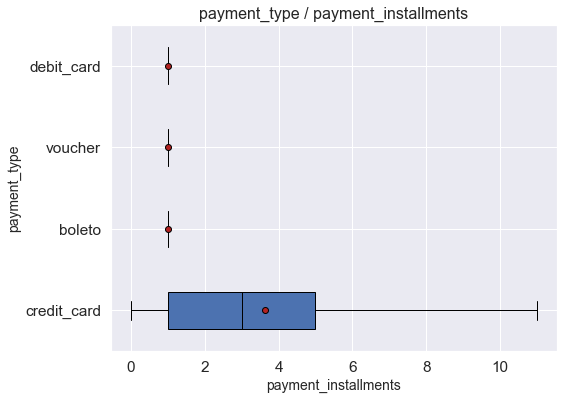

                    sum_sq        df            F  PR(>F)
C(catquali)  156856.180648       3.0  8211.124052     0.0
Residual     744827.958989  116971.0          NaN     NaN


C:\ProgramData\Anaconda3\lib\site-packages\bioinfokit\analys.py:402: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mult_group[ele] = df[df[xfac_var] == ele].mean().loc[res_var]


        group1      group2      Diff     Lower     Upper     q-value  p-value
0  credit_card      boleto  2.632524  2.584192  2.680855  197.891603    0.001
1  credit_card     voucher  2.632524  2.547706  2.717342  112.764455    0.001
2  credit_card  debit_card  2.632524  2.473060  2.791987   59.978990    0.001
3       boleto     voucher  0.000000 -0.092499  0.092499    0.000000    0.900
4       boleto  debit_card  0.000000 -0.163678  0.163678    0.000000    0.900
5      voucher  debit_card  0.000000 -0.177901  0.177901    0.000000    0.900


In [119]:
boxplots(dorder_p, 'payment_type', 'payment_installments', tukey=1, size=(8,6), showfliers=False, sort = 0)

In [120]:
dorder['payment_type'].value_counts()

credit_card    86294
boleto         22730
voucher         6266
debit_card      1685
Name: payment_type, dtype: int64

#### it shows that most people are using credit cards (1/4) and the credit cards users are also the one recouring the most to multiple payment installments (versements)

In [121]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0


customer_state    AC     AL     AM    AP      BA      CE      DF      ES  \
payment_type                                                               
boleto          16.0   70.0   26.0  23.0   696.0   220.0   441.0   473.0   
credit_card     72.0  366.0  137.0  57.0  2980.0  1219.0  1924.0  1720.0   
debit_card       2.0    5.0    2.0   NaN    53.0    20.0    18.0    27.0   
voucher          5.0   13.0    7.0   3.0   299.0    86.0    97.0   115.0   
Total           95.0  454.0  172.0  83.0  4028.0  1545.0  2480.0  2335.0   

customer_state      GO     MA       MG     MS      MT      PA     PB      PE  \
payment_type                                                                   
boleto           510.0  237.0   2685.0  202.0   272.0   230.0  114.0   296.0   
credit_card     1768.0  575.0  10113.0  601.0   775.0   815.0  471.0  1462.0   
debit_card        26.0    5.0    152.0   13.0     7.0    21.0   13.0    20.0   
voucher          126.0   26.0    625.0   35.0    71.0    51.0   37.

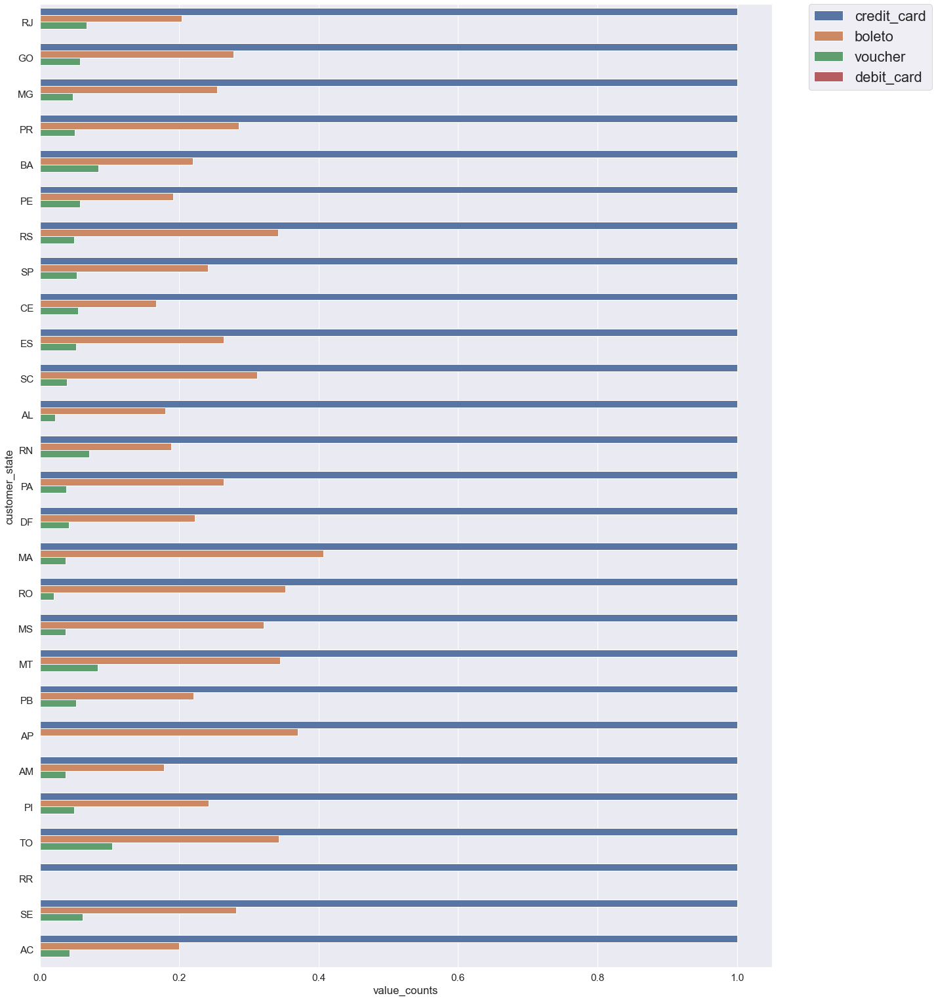

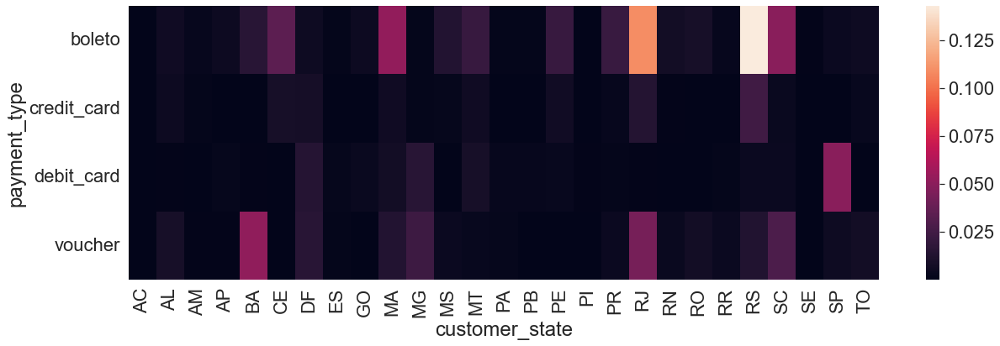

In [122]:
qualiqualinorm(dorder, 'payment_type', 'customer_state', piv=1, fig = 1, poli = 2, heat = 1, size2 = (20, 6))

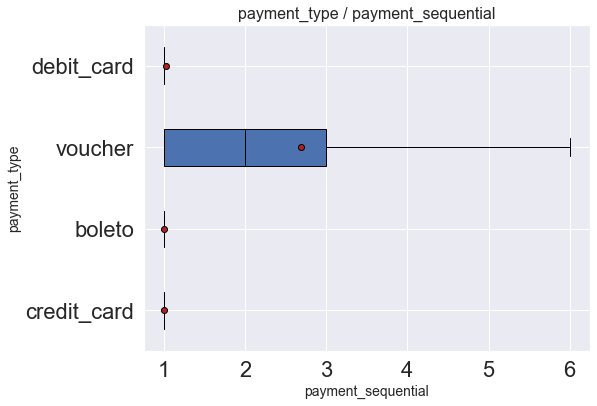

                   sum_sq        df             F  PR(>F)
C(catquali)  16838.617138       3.0  14450.533395     0.0
Residual     45433.845046  116971.0           NaN     NaN


C:\ProgramData\Anaconda3\lib\site-packages\bioinfokit\analys.py:402: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mult_group[ele] = df[df[xfac_var] == ele].mean().loc[res_var]


        group1      group2      Diff     Lower     Upper     q-value   p-value
0  credit_card      boleto  0.004232 -0.007705  0.016169    1.288094  0.773904
1  credit_card     voucher  1.684521  1.663572  1.705469  292.155793  0.001000
2  credit_card  debit_card  0.027771 -0.011613  0.067156    2.561904  0.267921
3       boleto     voucher  1.688753  1.665907  1.711598  268.569242  0.001000
4       boleto  debit_card  0.032003 -0.008422  0.072429    2.876292  0.175498
5      voucher  debit_card  1.656749  1.612811  1.700687  136.995214  0.001000


In [123]:
boxplots(dorder_p, 'payment_type', 'payment_sequential', tukey=1, size=(8,6), showfliers=False, sort = 0)

#### Most of the poeple using multiple methods of payment are using the voucher as one of the payment methods

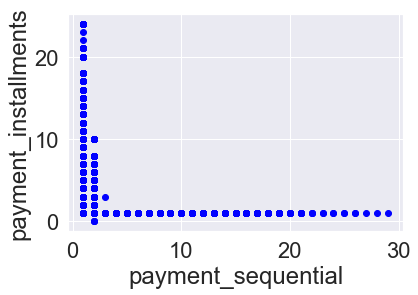

In [124]:
quantiquanti(dorder_p, 'payment_sequential', 'payment_installments', regl = 0, co = 0)

#### the number of installments is decoupled with the number of payment methods...

In [125]:
dorder_p['payment_type'].unique()

array(['credit_card', 'boleto', 'voucher', 'debit_card'], dtype=object)

In [126]:
dorder_p[dorder_p['payment_installments'].isin([7])].head(2)

,order_id,order_item_id,product_id,price,freight_value,payment_installments,payment_value,payment_sequential,payment_type
28,03054d8a8eefc2981cfad06f58e27979,1.0,3e31fd1419cc4cd6adad1925e72e3a03,58.9,15.16,7.0,74.06,1.0,credit_card
119,fa68c8eaee429c95ac88e1034d583057,1.0,9165e7a5f9ef266f66ca19a816cdc657,132.9,14.33,7.0,147.23,1.0,credit_card


In [127]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0


In [128]:
#si order_item_id > 1, soit prendre sum(price+freight)_en fonction de order / soit prendre sum sur order_item[0]de payment_value

## Feature engineering II

<a id='Total' />

### Total spent for one order

#### there is only 3 reasons why a specific order should appear multiple times in the database :
1. multiple items (order_item_id)
2. multiple reviews (review_id)
3. multiple method of payment (payment_sequential)
        multiple versements doesn't come into play (payment_installment)

In [129]:
def total_money_for_one_order(df) :

    # Total money spent for one order
    start = time.time()

    base = df['order_id'].unique() # Selection of all the unique order ids

    df['total_payment_value'] = df['payment_value']

    order_spending = df.copy()[[
        'order_id', 'order_item_id', 'price', 'freight_value', 'payment_sequential',
        'payment_installments']]

    for i in range(len(base)) :
        unique_order_id = order_spending['order_id'].isin([base[i]])
        echanti = order_spending[unique_order_id] # selecting one unique order_id
    
        echantindex = echanti.index.tolist() # Stroring the indexes to attribute later calculated values
    
        payment_seq = echanti[echanti['payment_sequential'] == 1] # Removing the multiple payment installements
    
        payment_seq.drop_duplicates() # Droping the multiple reviews
    
        total = payment_seq['price'].sum() + payment_seq['freight_value'].sum()
    
        df['total_payment_value'].loc[echantindex] = total
        
    end = time.time()
    print("total time: ",(end - start),"sec")

In [130]:
total_money_for_one_order(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  1066.256266117096 sec


In [131]:
#dorder[dorder['customer_unique_id'].isin(['8d50f5eadf50201ccdcedfb9e2ac8455'])]

In [132]:
dorder[dorder['customer_unique_id'].isin(['8d50f5eadf50201ccdcedfb9e2ac8455'])]['total_payment_value'].sum()

902.04

In [133]:
dorder[dorder['order_id'].isin(['4f62d593acae92cea3c5662c76122478'])]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value
47027,4f62d593acae92cea3c5662c76122478,1.0,94cc774056d3f2b0dc693486a589025e,1da3aeb70d7989d1e6d9b0e887f97c23,2017-07-24 23:23:26,13.99,7.78,1.0,credit_card,1.0,21.77,cb44e7ba6bacbf6f348aec2b9ab56790,5.0,Unknown,None,2017-07-22 00:00:00,2017-07-24 12:52:56,dfb941d6f7b02f57a44c3b7c3fefb44b,delivered,2017-07-18 23:10:58,2017-07-18 23:23:26,2017-07-20 19:00:02,2017-07-21 16:19:40,2017-07-31 00:00:00,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP,-23.618666,-46.639583,4265.0,sao paulo,SP,-23.587354,-46.615258,fashion_bolsas_e_acessorios,29.0,99.0,3.0,150.0,20.0,20.0,20.0,fashion_bags_accessories,564.882616,48805858.0,16,43277403,83178866,13.578137,0.201313,21.77


<a id='FullTotal' />

### Total spent by a customer

In [134]:
def total_spent_by_a_customer(df) :

    #Total value of all the payments for one customer
    start = time.time()

    df['tot_customer_spending'] = df['total_payment_value']

    basec = df['customer_unique_id'].unique()

    for i in range(len(basec)) :
        echantc = df[df['customer_unique_id'].isin([basec[i]])]
        zuap = echantc['order_id'].unique()
        if len(zuap) > 1 :
            tota = 0
            echantv = echantc.index.tolist()
            zuap = echantc['order_id'].unique()
            for i in range(len(zuap)) :
                tota = tota + echantc[echantc['order_id'].isin([zuap[i]])]['total_payment_value'].iloc[0]
            df['tot_customer_spending'].loc[echantv] = tota
                
    end = time.time()
    print("total time: ",(end - start),"sec")

In [135]:
total_spent_by_a_customer(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  830.0955669879913 sec


<a id='Satisfaction' />

## satisfaction of the customer

In [136]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19


In [137]:
len(dorder['review_id'].unique())

96667

In [138]:
len(dorder['order_id'].unique())

97583

#### Some order has multiple reviews

In [139]:
dorder[['order_id', 'review_id', 'review_score']].isna().mean()*100

order_id        0.000000
review_id       0.811284
review_score    0.811284
dtype: float64

In [140]:
dorder.shape[0]*0.811284/100

948.9994590000001

In [141]:
len(dorder['order_id'].unique()) - len(dorder['review_id'].unique())

916

In [142]:
#dorder['review_id'].value_counts()

In [143]:
pelo = dorder[dorder['review_id'].isin(['eef5dbca8d37dfce6db7d7b16dd0525e'])]
pelo[pelo['payment_sequential'] == 21]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending
95703,895ab968e7bb0d5659d16cd74cd1650c,1.0,ebf9bc6cd600eadd681384e3116fda85,822166ed1e47908f7cfb49946d03c726,2017-08-14 20:43:31,12.99,23.21,21.0,voucher,1.0,0.28,eef5dbca8d37dfce6db7d7b16dd0525e,5.0,Unknown,None,2017-08-15 00:00:00,2017-08-17 22:17:55,270c23a11d024a44c896d1894b261a83,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30 00:00:00,9a736b248f67d166d2fbb006bcb877c3,3227,sao paulo,SP,-23.586366,-46.571079,25803.0,tres rios,RJ,-22.117082,-43.211925,cama_mesa_banho,37.0,86.0,2.0,1300.0,50.0,9.0,41.0,bed_bath_table,585.768414,50610391.0,2,49546246,50610391,390.528079,0.06227,161.32,233.49
95724,895ab968e7bb0d5659d16cd74cd1650c,2.0,ebf9bc6cd600eadd681384e3116fda85,822166ed1e47908f7cfb49946d03c726,2017-08-14 20:43:31,12.99,23.21,21.0,voucher,1.0,0.28,eef5dbca8d37dfce6db7d7b16dd0525e,5.0,Unknown,None,2017-08-15 00:00:00,2017-08-17 22:17:55,270c23a11d024a44c896d1894b261a83,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30 00:00:00,9a736b248f67d166d2fbb006bcb877c3,3227,sao paulo,SP,-23.586366,-46.571079,25803.0,tres rios,RJ,-22.117082,-43.211925,cama_mesa_banho,37.0,86.0,2.0,1300.0,50.0,9.0,41.0,bed_bath_table,585.768414,50610391.0,2,49546246,50610391,390.528079,0.06227,161.32,233.49
108838,895ab968e7bb0d5659d16cd74cd1650c,3.0,5ddab10d5e0a23acb99acf56b62b3276,3d0cd21d41671c46f82cd11176bf7277,2017-08-14 20:43:31,83.80,5.12,21.0,voucher,1.0,0.28,eef5dbca8d37dfce6db7d7b16dd0525e,5.0,Unknown,None,2017-08-15 00:00:00,2017-08-17 22:17:55,270c23a11d024a44c896d1894b261a83,delivered,2017-08-08 20:26:31,2017-08-08 20:43:31,2017-08-10 11:58:14,2017-08-14 12:46:18,2017-08-30 00:00:00,9a736b248f67d166d2fbb006bcb877c3,3227,sao paulo,SP,-23.586366,-46.571079,89217.0,joinville,SC,-26.287074,-48.873740,utilidades_domesticas,56.0,548.0,8.0,450.0,30.0,20.0,11.0,housewares,585.768414,50610391.0,2,49546246,50610391,390.528079,0.06227,161.32,233.49


In [144]:
choci = dorder.dropna(subset=['review_id'])
dorder['review_score'].isna().sum()

949

#### Mean review value for one order

In [147]:
# This part gives a mean review for one order

def mean_review_for_an_order(df) :
    start = time.time()

    #df.insert(13, 'mean_review_score', df['review_score'].copy())
    df['mean_review_score'] = df['review_score'].copy()
    

    choci = df.dropna(subset=['review_id'])    # removing the Nan
    choco = choci['order_id'].unique()

    for i in range(len(choco)) :
        revlist = df[df['order_id'].isin([choco[i]])]
        revuni = revlist['review_id'].unique()
        if len(revuni) > 1 :
            note = 0
            revindex = revlist.index.tolist()
            for i in range(len(revuni)) :
                note = note + revlist[revlist['review_id'].isin([revuni[i]])]['review_score'].iloc[0]
            df['mean_review_score'].loc[revindex] = note / len(revuni)
                
    end = time.time()
    print("total time: ",(end - start),"sec")

In [148]:
mean_review_for_an_order(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  889.4030389785767 sec


#### Mean review value for one customer

In [149]:
# This part gives a mean review for a customer

def mean_review_for_one_customer(df) :
    start = time.time()

    df['Cus_mean_review_score'] = df['review_score']
    cuz = df.dropna(subset=['Cus_mean_review_score'])    # removing the na()

    unicusty = cuz['customer_unique_id'].unique()

    for i in range(len(unicusty)) :
        coco = cuz[cuz['customer_unique_id'].isin([unicusty[i]])]    # selecting one unique customer
        nb_order = coco['order_id'].unique()
        mean_sco = 0
        if len(nb_order) > 1 :
            indexcoco = coco.index.tolist()   # selecting the index related to this specific customer
            for i in range(len(nb_order)) :
                mean_sco = mean_sco + coco[coco['order_id'].isin([nb_order[i]])]['review_score'].iloc[0]
            df['Cus_mean_review_score'].loc[indexcoco] =  mean_sco / len(nb_order)
    
    end = time.time()
    print("total time: ",(end - start),"sec")

In [218]:
mean_review_for_one_customer(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  433.6036159992218 sec


<a id='Delivery' />

## delivery_time

In [150]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0


In [151]:
def delivery_time(df) :

    # df.insert(24, 'order_delivered_time', np.nan)
    # df.insert(26, 'order_estimated_delivery', np.nan)

    #from datetime to number of days
    startt = time.time()

    for i in range(df.shape[0]) :
        if (df.loc[i, 'order_delivered_customer_date'] == df.loc[i, 'order_delivered_customer_date']) :
            delivered_in_sec_from_Jan_1970 = datetime.timestamp(datetime.strptime(df.loc[i, 'order_delivered_customer_date'],
                                                                          "%Y-%m-%d %X"))    
            delivered_in_days_from_Jan_2016 = (delivered_in_sec_from_Jan_1970 / (60 * 60 * 24)) - (35*(365)+11*(366))
            df.loc[i, 'order_delivered_time'] = delivered_in_days_from_Jan_2016
    
        if (df.loc[i, 'order_estimated_delivery_date'] == df.loc[i, 'order_estimated_delivery_date']) :
            estimated_in_sec_from_Jan_1970 = datetime.timestamp(datetime.strptime(df.loc[i, 'order_estimated_delivery_date'],
                                                                          "%Y-%m-%d %X"))
            estimated_in_days_from_Jan_2016 = (estimated_in_sec_from_Jan_1970 / (60 * 60 * 24)) - (35*(365)+11*(366))
            df.loc[i, 'order_estimated_delivery'] = estimated_in_days_from_Jan_2016

    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [152]:
delivery_time(dorder)

total time:  58.67085909843445 sec


In [155]:
def delay(df) :

    #delay between the estimated time and the delivered time
    # df.insert(27, 'delay_delivery', np.nan)
    df['delay_delivery'] = np.nan

    startt = time.time()

    condd = 1
    condition = [(condd == 1)]

    choice = [df['order_estimated_delivery'] - df['order_delivered_time']] 

    df['delay_delivery'] = np.select(condlist= condition, choicelist=choice, default = df['delay_delivery'])
          
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [156]:
delay(dorder)

total time:  0.0020008087158203125 sec


<a id='Distance' />

### distance

In [157]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.01125


In [158]:
def distance(df) :

    #distance between buyer and seller
    df.insert(28, 'distance', np.nan)

    startt = time.time()

    condd = 1
    condition = [(condd == 1)]

    choice = [np.sqrt(np.absolute(np.square(df['geo_mlng_customer'] - df['geo_mlng_seller']) 
                                  + (df['geo_mlat_customer'] - df['geo_mlat_seller'])))] 

    df['distance'] = np.select(condlist= condition, choicelist=choice, default = df['distance'])
          
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [159]:
distance(dorder)

total time:  0.003500699996948242 sec


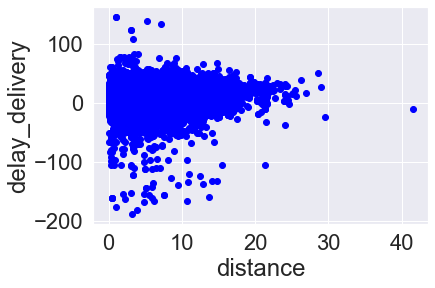

In [160]:
quantiquanti(dorder, 'distance', 'delay_delivery', regl = 0, co = 0)

In [161]:
dorder[dorder['delay_delivery'] < -60][['order_delivered_customer_date', 'order_estimated_delivery_date',
                                        'delay_delivery', 'review_answer_timestamp', 'review_score']].head()

,order_delivered_customer_date,order_estimated_delivery_date,delay_delivery,review_answer_timestamp,review_score
49,2017-11-09 18:08:54,2017-08-23 00:00:00,-78.797847,2017-08-25 11:15:52,5.0
3708,2017-09-19 15:07:09,2017-05-05 00:00:00,-137.629965,2017-04-29 21:03:15,3.0
5981,2018-05-10 00:06:20,2017-12-18 00:00:00,-142.962731,2017-12-19 13:11:18,1.0
6273,2017-12-23 20:07:03,2017-10-19 00:00:00,-65.879896,NaN,NaN
7280,2017-10-26 20:47:58,2017-06-27 00:00:00,-121.866644,2017-06-30 10:29:30,4.0


In [162]:
dorder[['delay_delivery', 'distance']].isna().mean()

delay_delivery    0.010797
distance          0.004873
dtype: float64

<a id='category' />

## Most used categories

In [163]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,distance,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,2.945252,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.01125


['Sao Paulo', 'Rio de Jannero', 'Minas Gerais', 'Rio Grande do Sul', 'Paraná', 'Santa Catarina', 'Bahia' ]  <br>
Population = [11895893, 12620000, 21168791, 11322900, 11433957, 6249682, 15344447] <br>
The biggest city doesn't have the most customers !

In [164]:
categs = list(dorder['product_category_name_english'].value_counts(sort = True, ascending = True).index)

refining = pd.DataFrame(categs, columns = ['categories'])

refining["Counts"] = list(dorder['product_category_name_english'].value_counts(sort = True, ascending = True))
#refining["Index"] = range(0, refining.shape[0])

#print(refining)

#### Refining the categories
We want to avoid categories with a low number of individuals

In [165]:
# For all the orders that have more than 1 item, I check wich ones have different categories
startt = time.time()

diffcateg = dorder[dorder['order_item_id'] > 1]
uniq = diffcateg['order_id'].unique()
orders = []

for i in range(len(uniq)) :
    bolet = dorder[dorder['order_id'].isin([uniq[i]])]
    cotogo = bolet['product_category_name_english'].tolist()
    for i in range(1, len(bolet)) :
        if cotogo[0] != cotogo[i] :
            orders.append(bolet['order_id'])
            break
        break
            
endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  86.16621375083923 sec


In [166]:
len(orders)

740

In [167]:
# COunting for each categories : the total amounts, the total counts, the mean amount
startt = time.time()

uniqc = dorder['product_category_name_english'].unique()

catnam = []
catsom = []
cattail = []
catmean = []

for i in range(len(uniqc)) :
    dorderca = dorder[dorder['product_category_name_english'].isin([uniqc[i]])]
    dordercb = dorderca[dorderca['payment_sequential'] == 1]
    sommel = dordercb['price'].sum() + dordercb['freight_value'].sum()
    catnam.append(uniqc[i])
    catsom.append(sommel)
    cattail.append(dordercb.shape[0])
    catmean.append(sommel/dordercb.shape[0])
    

endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.352062463760376 sec


In [168]:
# dataframe with the previous variables
categos = pd.DataFrame(catnam, columns = ['categories'])

categos["Total_spent"] = catsom
#categos["Nb_of_trans"] = cattail
categos["Mean_spent"] =catmean

In [169]:
# Merging the two dataframes
finalcat = refining.merge(categos, left_on = 'categories',
                      right_on = 'categories',
                      how = 'left')
print(finalcat.sort_values(by=['Mean_spent'], ascending=False))

                                 categories  Counts  Total_spent   Mean_spent
26                                computers     219    231116.02  1144.138713
16    small_appliances_home_oven_and_coffee      77     50093.46   667.912800
30                        home_appliances_2     267    121357.98   512.058987
28               agro_industry_and_commerce     251     78345.85   371.307346
47                      musical_instruments     693    202263.65   310.220322
46                         small_appliances     688    200818.89   301.983293
29                          fixed_telephony     263     59907.94   233.104825
23                construction_tools_safety     187     42504.02   232.262404
19                        furniture_bedroom     121     23860.62   227.244000
64                            watches_gifts    6151   1288943.02   217.176583
36                         air_conditioning     299     61318.33   208.565748
35  kitchen_dining_laundry_garden_furniture     294     57764.93

In [170]:
# # Of course, the best who'd be to ask marketing people to deal with the categories
# #dorder.insert(41, 'categories', dorder['product_category_name_english'])
# # I have merged the previous categories in 7 bigger groups

# startt = time.time()

# bol = 'categories'
# dorder[bol] = dorder['product_category_name_english']

# condition = [(dorder[bol] == categs[2]) | (dorder[bol] == categs[4]) | (dorder[bol] == categs[7]) 
#              | (dorder[bol] == categs[9]) | (dorder[bol] == categs[13]) | (dorder[bol] == categs[14]) 
#              | (dorder[bol] == categs[15]) | (dorder[bol] == categs[17]) | (dorder[bol] == categs[25]) 
#              | (dorder[bol] == categs[29]) | (dorder[bol] == categs[31]) | (dorder[bol] == categs[39]) 
#              | (dorder[bol] == categs[44]) | (dorder[bol] == categs[47]) | (dorder[bol] == categs[63]),
             
#              (dorder[bol] == categs[18]) | (dorder[bol] == categs[23]) | (dorder[bol] == categs[27]) 
#              | (dorder[bol] == categs[28]) | (dorder[bol] == categs[32]) | (dorder[bol] == categs[36]) 
#              | (dorder[bol] == categs[37]) | (dorder[bol] == categs[38]) | (dorder[bol] == categs[45]) 
#              | (dorder[bol] == categs[49]) | (dorder[bol] == categs[52]) | (dorder[bol] == categs[55]),
             
#              (dorder[bol] == categs[0]) | (dorder[bol] == categs[24]) | (dorder[bol] == categs[26]) 
#              | (dorder[bol] == categs[66]),
             
#              (dorder[bol] == categs[1]) | (dorder[bol] == categs[5]) | (dorder[bol] == categs[8]) 
#              | (dorder[bol] == categs[12]) | (dorder[bol] == categs[20]) | (dorder[bol] == categs[21]) 
#              | (dorder[bol] == categs[33]) | (dorder[bol] == categs[51]) | (dorder[bol] == categs[54]) 
#              | (dorder[bol] == categs[57]),
             
#              (dorder[bol] == categs[11]) | (dorder[bol] == categs[22]) | (dorder[bol] == categs[50]) 
#              | (dorder[bol] == categs[60]) | (dorder[bol] == categs[64]),
             
#              (dorder[bol] == categs[3]) | (dorder[bol] == categs[6]) | (dorder[bol] == categs[10]) 
#              | (dorder[bol] == categs[16]) | (dorder[bol] == categs[19]) | (dorder[bol] == categs[30]) 
#              | (dorder[bol] == categs[35]) | (dorder[bol] == categs[43]) | (dorder[bol] == categs[46]) 
#              | (dorder[bol] == categs[48]) | (dorder[bol] == categs[62]) | (dorder[bol] == categs[65]) 
#              | (dorder[bol] == categs[67]) | (dorder[bol] == categs[70]),
             
#              (dorder[bol] == categs[34]) | (dorder[bol] == categs[40]) | (dorder[bol] == categs[42]) 
#              | (dorder[bol] == categs[58]) | (dorder[bol] == categs[68])                  
# ]

# choice = ['arts_video_audio', 'industry_commerce_construction',
#           categs[56], 'clothing_and_bags', 
#           categs[59], categs[41],
#           categs[69]    
# ] 

# dorder['categories'] = np.select(condlist= condition, choicelist=choice, default = dorder['categories'])
          
# endt = time.time()
# print("total time: ",(endt - startt),"sec")

In [171]:
def afining_the_catstartt(df) :

    startt = time.time()

    bol = 'categories'
    df[bol] = df['product_category_name_english']

    condition = [(df[bol] == 'cds_dvds_musicals') | (df[bol] == 'arts_and_craftmanship') 
                 | (df[bol] == 'flowers') | (df[bol] == 'music') | (df[bol] == 'books_imported') 
                 | (df[bol] == 'dvds_blu_ray') | (df[bol] == 'cine_photo') 
                 | (df[bol] == 'tablets_printing_image') | (df[bol] == 'art') | (df[bol] == 'fixed_telephony') 
                 | (df[bol] == 'books_technical') | (df[bol] == 'audio') 
                 | (df[bol] == 'books_general_interest') | (df[bol] == 'musical_instruments') 
                 | (df[bol] == 'telephony'),
             
                 (df[bol] == 'costruction_tools_tools') | (df[bol] == 'construction_tools_safety') 
                 | (df[bol] == 'costruction_tools_garden') | (df[bol] == 'agro_industry_and_commerce') 
                 | (df[bol] == 'industry_commerce_and_business') | (df[bol] == 'air_conditioning') 
                 | (df[bol] == 'construction_tools_lights') | (df[bol] == 'market_place') 
                 | (df[bol] == 'home_construction') | (df[bol] == 'construction_tools_construction') 
                 | (df[bol] == 'office_furniture') | (df[bol] == 'stationery'),
             
                 (df[bol] == 'security_and_services') | (df[bol] == 'signaling_and_security') 
                 | (df[bol] == 'computers') | (df[bol] == 'computers_accessories'),
             
                 (df[bol] == 'fashion_childrens_clothes') | (df[bol] == 'fashion_sport') 
                 | (df[bol] == 'diapers_and_hygiene') | (df[bol] == 'fashio_female_clothing') 
                 | (df[bol] == 'fashion_male_clothing') | (df[bol] == 'fashion_underwear_beach') 
                 | (df[bol] == 'fashion_shoes') | (df[bol] == 'luggage_accessories') 
                 | (df[bol] == 'fashion_bags_accessories') 
                 | (df[bol] == 'baby'),
             
                 (df[bol] == 'party_supplies') | (df[bol] == 'christmas_supplies') | (df[bol] == 'consoles_games') 
                 | (df[bol] == 'toys') | (df[bol] == 'watches_gifts'),
             
                 (df[bol] == 'la_cuisine') | (df[bol] == 'home_comfort_2') 
                 | (df[bol] == 'furniture_mattress_and_upholstery') 
                 | (df[bol] == 'small_appliances_home_oven_and_coffee') | (df[bol] == 'furniture_bedroom') 
                 | (df[bol] == 'home_appliances_2') | (df[bol] == 'kitchen_dining_laundry_garden_furniture') 
                 | (df[bol] == 'furniture_living_room') | (df[bol] == 'small_appliances') 
                 | (df[bol] == 'home_appliances') | (df[bol] == 'garden_tools') | (df[bol] == 'housewares') 
                 | (df[bol] == 'furniture_decor') | (df[bol] == 'bed_bath_table'),
             
                 (df[bol] == 'food_drink') | (df[bol] == 'drinks') | (df[bol] == 'food') 
                 | (df[bol] == 'perfumery') | (df[bol] == 'sports_leisure')                  
    ]

    choice = ['arts_video_audio', 'industry_commerce_construction',
              'electronics', 'clothing_and_bags', 
              'cool_stuff', 'home_confort',
              'health_beauty'    
    ] 

    df['categories'] = np.select(condlist= condition, choicelist=choice, default = df['categories'])
          
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [172]:
afining_the_catstartt(dorder)

total time:  0.2675473690032959 sec


In [173]:
# COunting for each new categories : the total amounts, the total counts, the mean amount
startt = time.time()

uniqca = dorder['categories'].unique()

catnam2 = []
catsom2 = []
cattail2 = []
catmean2 = []

for i in range(len(uniqca)) :
    dorderca2 = dorder[dorder['categories'].isin([uniqca[i]])]
    dordercb2 = dorderca2[dorderca2['payment_sequential'] == 1]
    sommel2 = dordercb2['price'].sum() + dordercb2['freight_value'].sum()
    catnam2.append(uniqca[i])
    catsom2.append(sommel2)
    cattail2.append(dordercb2.shape[0])
    catmean2.append(sommel2/dordercb2.shape[0])
    

endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.2965521812438965 sec


In [174]:
# dataframe with the previous variables
categas = pd.DataFrame(catnam2, columns = ['categories_old'])

categas["Total_spent_new"] = catsom2
#categas["Nb_of_trans"] = cattail2
categas["Mean_spent_new"] =catmean2

In [175]:
#Keeping only one lane for each category
dut = dorder.copy()

print(dut.shape)
print('--'*5)

dut.drop_duplicates(subset ='product_category_name_english', inplace = True)

print(dut.shape)

(116975, 59)
----------
(72, 59)


In [176]:
dut = dut[['product_category_name_english', 'categories']]
print(dut.shape)

(72, 2)


In [177]:
dut.sort_values(by='categories')

,product_category_name_english,categories
82454,arts_and_craftmanship,arts_video_audio
919,dvds_blu_ray,arts_video_audio
867,books_technical,arts_video_audio
82208,flowers,arts_video_audio
16132,musical_instruments,arts_video_audio
21482,books_general_interest,arts_video_audio
437,audio,arts_video_audio
7197,fixed_telephony,arts_video_audio
23507,art,arts_video_audio
432,telephony,arts_video_audio


In [178]:
# # Merging the three dataframes
# finalcat2 = dut.merge(categos[['Mean_spent', 'categories']], left_on = 'categories',
#                                                             right_on = 'categories',
#                                                             how = 'left')

# finalcat3 = finalcat2.merge(categas[['categories_old', 'Mean_spent_new']], left_on = 'categories',
#                                                             right_on = 'categories_old',
#                                                             how = 'left')

# print(finalcat3.sort_values(by=['Mean_spent_new'], ascending=False))

<a id='artic' />

#### number of articles

In [179]:
dorder.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,distance,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery,categories
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,2.945252,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.01125,cool_stuff


In [182]:
def number_of_articles(df) :
    startt = time.time()

    df['Number_of_articles'] = 1

    unicusto = dorder['customer_unique_id'].unique()

    for i in range(len(unicusto)) :
        sumnumber = 0
        coco = df[df['customer_unique_id'].isin([unicusto[i]])]
        indexcoco = coco.index.tolist()
        oneorder = coco['order_id'].unique()
        for y in range(len(oneorder)) :
            bibalo = coco[coco['order_id'].isin([oneorder[y]])]
            number_of_articles = max(bibalo['order_item_id'])
            sumnumber = sumnumber + number_of_articles
        df['Number_of_articles'].loc[indexcoco] = sumnumber
        
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [183]:
number_of_articles(dorder)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


total time:  602.6786572933197 sec


In [184]:
# #double check
# dorder[dorder['Number_of_articles'] > 3]

In [185]:
#dorder[dorder['customer_unique_id'].isin(['3d50a44231c2a153219cef76ee3e445d'])]

#### Mean spending by article

In [186]:
startt = time.time()

condd = 1
condition = [(condd == 1)]

choice = [dorder['tot_customer_spending'] / dorder['Number_of_articles']] 

dorder['mean_spending'] = np.select(condlist= condition, choicelist=choice, default = 0)
          
endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.0020008087158203125 sec


In [187]:
#dorder[dorder['Number_of_articles'] > 2]

<a id='pref' />

#### Prefered method of payment

#### Credit_card : withdraw from the pre approved credit limit
#### boleto : "boletto bancario" is a popolar cash method of payment in Brazil (15% of the market). 35% of people without bank account use boletto bancario, the payent is done by a coupon (source : adyen.com)
#### voucher : coupon or ticket, that is redeemable for some good or service
#### debit card : debited from your account

In [188]:
# Categories for one client, I can maybe one hot encod by hand and fill it for each customers
def most_used_and_spent(df) :

    startt = time.time()

    df['Most_used_method_of_payment'] = 1
    df['Method_used_to_spend_the_most'] = 1

    payment_type = ['credit_card', 'boleto', 'voucher', 'debit_card']

    unicusto = df['customer_unique_id'].unique()

    for i in range(len(unicusto)) :
        coco = df[df['customer_unique_id'].isin([unicusto[i]])] #select one customer
        indexcoco = coco.index.tolist() # retrieve the index
        single_methods = coco[coco['order_item_id'] == 1] # Remove the order_item above 1
        payment_count = []
        payment_value = []
    
        for y in range(len(payment_type)) :
            payment_count.append(len(single_methods[single_methods['payment_type'] == payment_type[y]]))
            payment_value.append(single_methods[single_methods['payment_type'] == payment_type[y]]['payment_value'].sum())
        
        max_count = max(payment_count)
        max_value = max(payment_value)
    
        for u in range(len(payment_type)) :
            if payment_count[u] == max_count :
                df['Most_used_method_of_payment'].loc[indexcoco] = payment_type[u]
                break
            
        for v in range(len(payment_type)) :
                if payment_value[v] == max_value :
                    df['Method_used_to_spend_the_most'].loc[indexcoco] = payment_type[v]
                    break
    
        # Version to create a new cat or a non cat where 2 methods are equivelent
    #     if max_count > sorted(payment_count, reverse = True)[1] :
    #         for u in range(len(payment_type)) :
    #             if payment_count[u] == max_count :
    #                 df['Most_used_method_of_payment'].loc[indexcoco] = payment_type[u]
    #                 break
    #     else :
    #         df['Most_used_method_of_payment'].loc[indexcoco] = 'None'
        
    #     if max_value > sorted(payment_value, reverse = True)[1] :
    #         for v in range(len(payment_type)) :
    #             if payment_value[v] == max_value :
    #                 df['Method_used_to_spend_the_most'].loc[indexcoco] = payment_type[v]
    #                 break
    #     else :
    #         df['Method_used_to_spend_the_most'].loc[indexcoco] = 'None'
        
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [189]:
most_used_and_spent(dorder)

total time:  806.0993540287018 sec


In [190]:
#dorder[dorder['Most_used_method_of_payment'] == 'None']

In [191]:
#dorder[dorder['customer_unique_id'].isin(['0efd4833752113fedce2e7250d49d5ac'])]

In [192]:
#dorder[dorder['order_id'].isin(['3a1ce4053005d669ac4e0047a13573cf'])]

In [193]:
#dorder[dorder['Number_of_articles'] > 4]

In [49]:
#dorder.insert(65, 'MUM_of_payment_a', 7)

def mum_a(df) :

    # Methods of payment as 1-2-3-4
    startt = time.time()

    condition = [(df['Most_used_method_of_payment'] == 'credit_card'),
             (df['Most_used_method_of_payment'] == 'boleto'),
             (df['Most_used_method_of_payment'] == 'voucher'),
             (df['Most_used_method_of_payment'] == 'debit_card')           
    ]

    choice = [1, 2, 3, 4] 

    df['MUM_of_payment_a'] = np.select(condlist= condition, choicelist=choice, default = 0)
          
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [50]:
mum_a(dorder)

total time:  0.021503448486328125 sec


In [51]:
def mu_a(df) :
    
    # df.insert(67, 'MU_to_spend_the_most_a', 7)

    # M used M of payment as 1-2-3-4
    startt = time.time()

    condition = [(df['Method_used_to_spend_the_most'] == 'credit_card'),
                 (df['Method_used_to_spend_the_most'] == 'boleto'),
                 (df['Method_used_to_spend_the_most'] == 'voucher'),
                 (df['Method_used_to_spend_the_most'] == 'debit_card')           
    ]

    choice = [1, 2, 3, 4] 

    df['MU_to_spend_the_most_a'] = np.select(condlist= condition, choicelist=choice, default = 0)
          
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [52]:
mu_a(dorder)

total time:  0.025004148483276367 sec


<a id='one' />

#### One hot encoding of the categories by hand and prefered categories

In [198]:
# dorder[dorder['customer_unique_id'].isin(['47c1a3033b8b77b3ab6e109eb4d5fdf3'])]

In [199]:
# Categories for one client, I can maybe one hot encod by hand and fill it for each customers

def alpha_cat(df) :
    
    startt = time.time()

    df['Preferred category'] = 'None'
    category_names = df['categories'].unique().tolist()


    for i in range(len(category_names)) :
        df[category_names[i]] = 0

    unicusto = df['customer_unique_id'].unique()

    for i in range(len(unicusto)) :
        coco = df[df['customer_unique_id'].isin([unicusto[i]])] #select one customer
        indexcoco = coco.index.tolist() # retrieve the index
        single_methods = coco[coco['payment_sequential'] == 1] # Remove the payment_sequential above 1
    
        number_of_article_by_cat = []
    
        for y in range(len(category_names)) :
            number_of_article_by_cat.append(len(single_methods[single_methods['categories'].isin([category_names[y]])]))
            if number_of_article_by_cat[y] > 0 :
                 df[category_names[y]].loc[indexcoco] = number_of_article_by_cat[y]
                
        max_orders = max(number_of_article_by_cat)
        for v in range(len(category_names)) :
            if number_of_article_by_cat[v] == max_orders :
                df['Preferred category'].loc[indexcoco] = category_names[v]
                           
    endt = time.time()
    print("total time: ",(endt - startt),"sec")

In [200]:
alpha_cat(dorder)

total time:  824.3575983047485 sec


In [248]:
#dorder.to_csv('dorder_clean10.csv')

In [56]:
dorder.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,distance,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery,categories,Number_of_articles,mean_spending,Most_used_method_of_payment,Method_used_to_spend_the_most,MUM_of_payment_a,MU_to_spend_the_most_a,Preferred category,cool_stuff,pet_shop,home_confort,health_beauty,electronics,industry_commerce_construction,arts_video_audio,clothing_and_bags,auto,alpha_cats,Cus_mean_review_score
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,2.945252,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.011250,cool_stuff,1,72.19,credit_card,credit_card,1,1,cool_stuff,1,0,0,0,0,0,0,0,0,1,5.0
1,130898c0987d1801452a8ed92a670612,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,1.0,boleto,1.0,73.86,b11cba360bbe71410c291b764753d37f,5.0,Unknown,"lannister como sempre, entregou certinho e dentro do prazo. recomendo muito",2017-07-14 00:00:00,2017-07-17 12:50:07,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO,7.887528,-17.884337,-51.716990,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,544.411343,47037140.0,1,47037140,47037140,431.885150,1.0,73.86,73.86,5.0,559.777419,571.916667,12.139248,cool_stuff,1,73.86,boleto,boleto,2,2,cool_stuff,1,0,0,0,0,0,0,0,0,1,5.0
2,532ed5e14e24ae1f0d735b91524b98b9,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,1.0,credit_card,2.0,83.23,af01c4017c5ab46df6cc810e069e654a,4.0,super recomendo,carrinho muito bonito,2018-06-05 00:00:00,2018-06-06 21:41:12,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG,1.614209,-19.914323,-43.975703,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,868.351308,75025553.0,1,75025553,75025553,107.945185,1.0,83.23,83.23,4.0,885.690579,887.916667,2.226088,cool_stuff,1,83.23,credit_card,credit_card,1,1,cool_stuff,1,0,0,0,0,0,0,0,0,1,4.0
3,6f8c31653edb8c83e1a739408b5ff750,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,1.0,credit_card,3.0,75.07,8304ff37d8b16b57086fa283fe0c44f8,5.

# Part 3 - Selected criteria

#### clients unique

In [18]:
#Keeping only one lane per unique customer
dat = dorder.copy()

print(dat.shape)
print('--'*5)

dat.drop_duplicates(subset ="customer_unique_id", inplace = True)

print(dat.shape)

(116975, 78)
----------
(94397, 78)


<a id='finance' />

## Financial criteria

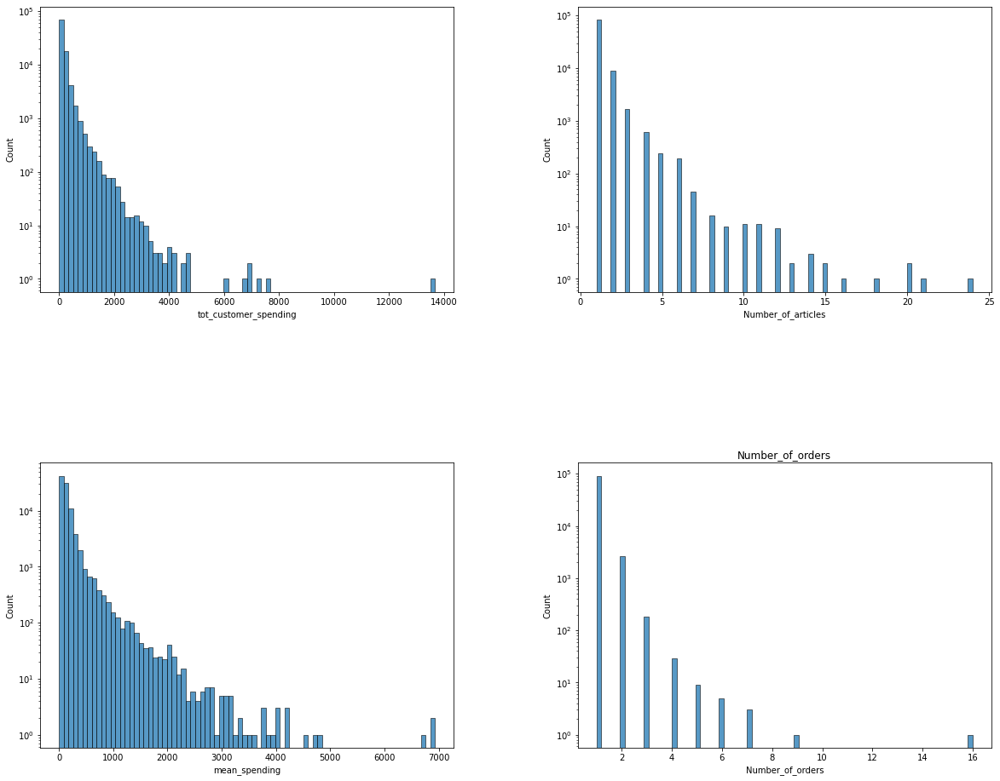

In [19]:
dfc = dat[['tot_customer_spending','Number_of_articles', 'mean_spending', 'Number_of_orders']]
dfcl = list(dfc)
dfcll = len(dfcl)
si = int(dfcll/2)

fig, axes = plt.subplots(ncols=2, nrows=si, figsize=(20, dfcll*4))
fig.subplots_adjust(wspace=0.3, hspace=0.6)

nbins = 80
    
for i, ax in zip(range(dfcll), axes.flat):

    sns.histplot(data=dfc[dfcl[i]].dropna(), kde=False, bins=nbins, log_scale=(False, True), ax=ax)
    plt.title(dfcl[i])

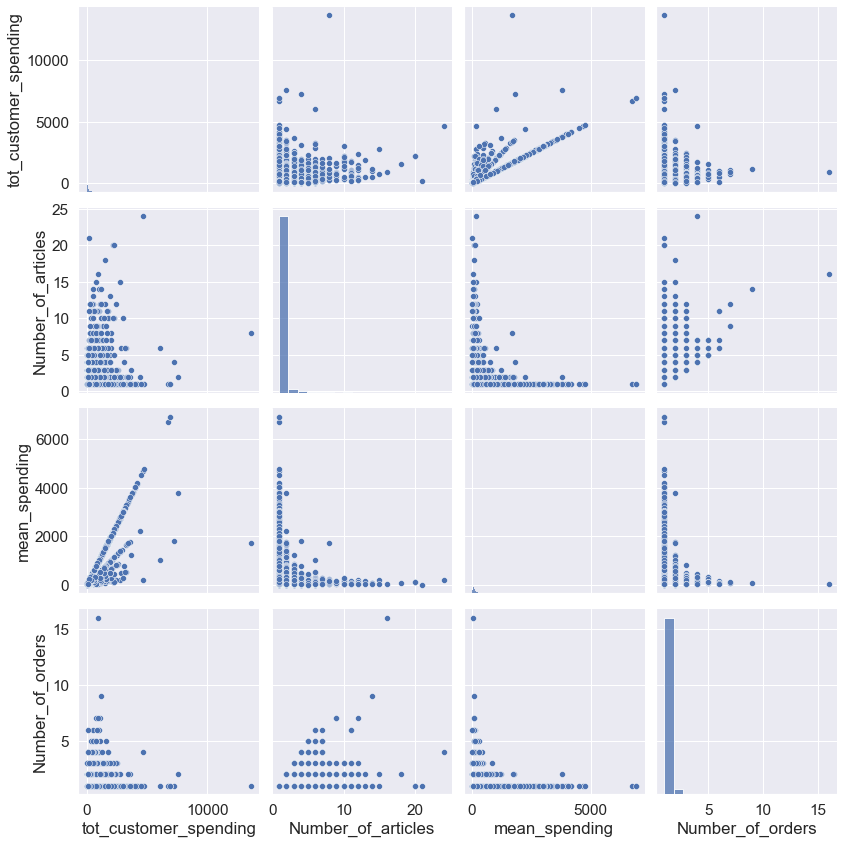

In [20]:
sns.set(font_scale = 1.4)
sns.pairplot(dfc, height=3)

In [21]:
dat[['tot_customer_spending','Number_of_articles', 'mean_spending']].describe()

,tot_customer_spending,Number_of_articles,mean_spending
count,94397.000000,94397.000000,94397.000000
mean,165.839932,1.179900,146.344861
std,227.608391,0.619634,197.993944
min,0.000000,1.000000,0.000000
25%,63.010000,1.000000,57.820000
50%,107.800000,1.000000,96.710000
75%,183.080000,1.000000,163.060000
max,13664.080000,24.000000,6929.310000


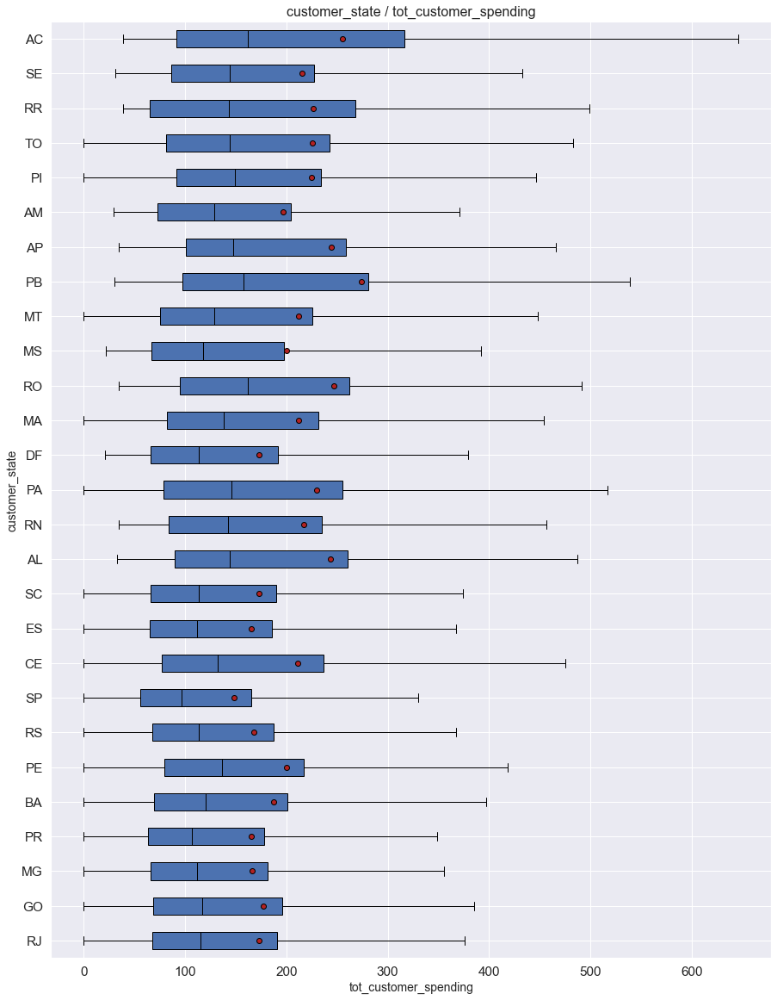

                   sum_sq       df          F         PR(>F)
C(catquali)  4.338946e+07     26.0  32.492658  1.456968e-160
Residual     4.846850e+09  94370.0        NaN            NaN


In [22]:
boxplots(dat, 'customer_state', 'tot_customer_spending', tukey=0, size=(15,20), showfliers=False, sort = 0)

#### There is a obvious correlation between the amount spent by one customer which is ~ to the Number of articles * the mean_spending

<a id='categ' />

## Categories

In [23]:
dat.head(1)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,distance,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery,categories,Number_of_articles,mean_spending,Most_used_method_of_payment,Method_used_to_spend_the_most,MUM_of_payment_a,MU_to_spend_the_most_a,Preferred category,cool_stuff,pet_shop,Unnamed: 69,home_confort,health_beauty,electronics,industry_commerce_construction,arts_video_audio,clothing_and_bags,auto,alpha_cats,Cus_mean_review_score
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,2.945252,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.01125,cool_stuff,1,72.19,credit_card,credit_card,1,1,cool_stuff,1,0,0,0,0,0,0,0,0,0,1,5.0


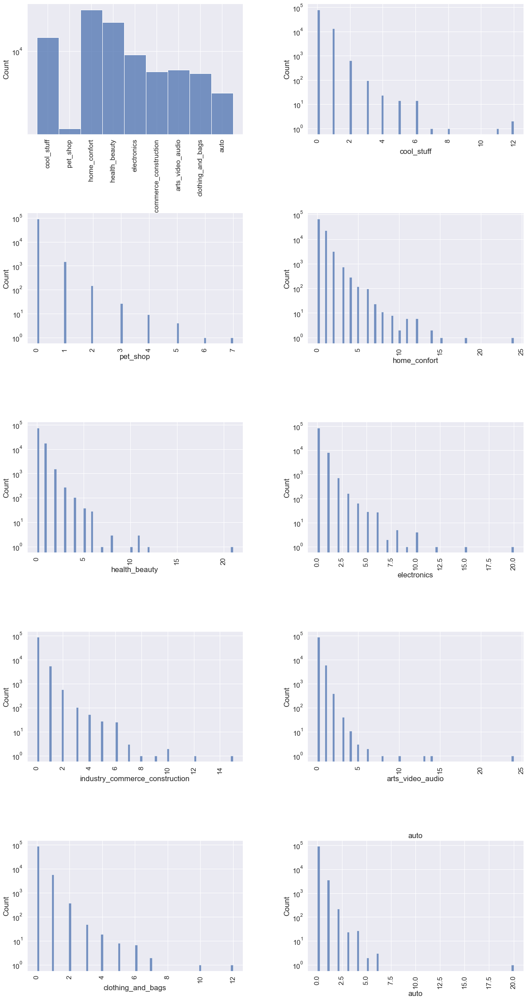

In [24]:
dfc = dat[['categories', 'cool_stuff', 'pet_shop', 'home_confort', 'health_beauty', 'electronics',
           'industry_commerce_construction', 'arts_video_audio', 'clothing_and_bags', 'auto']]
dfcl = list(dfc)
dfcll = len(dfcl)
si = int(dfcll/2)

fig, axes = plt.subplots(ncols=2, nrows=si, figsize=(20, dfcll*4))
fig.subplots_adjust(wspace=0.3, hspace=0.6)

nbins = 80
    
for i, ax in zip(range(dfcll), axes.flat):

    sns.histplot(data=dfc[dfcl[i]].dropna(), kde=False, bins=nbins, log_scale=(False, True), ax=ax)
    ax.tick_params(axis='x', rotation=90)
    plt.title(dfcl[i])

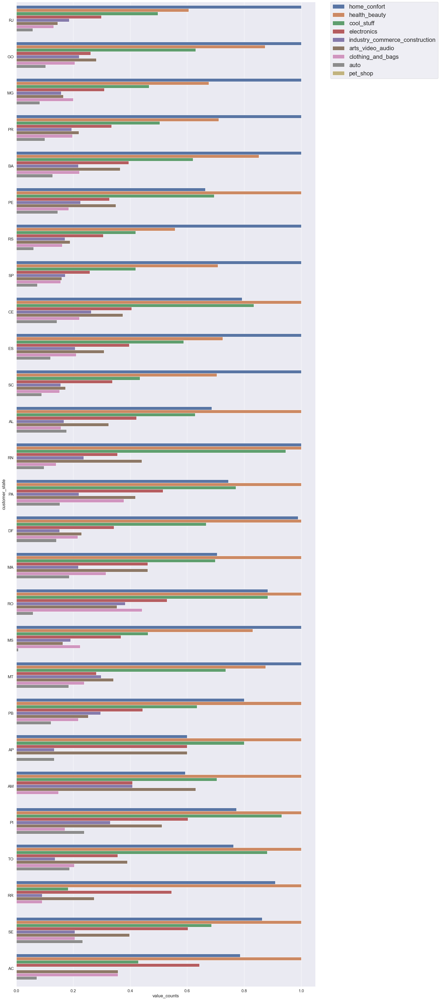

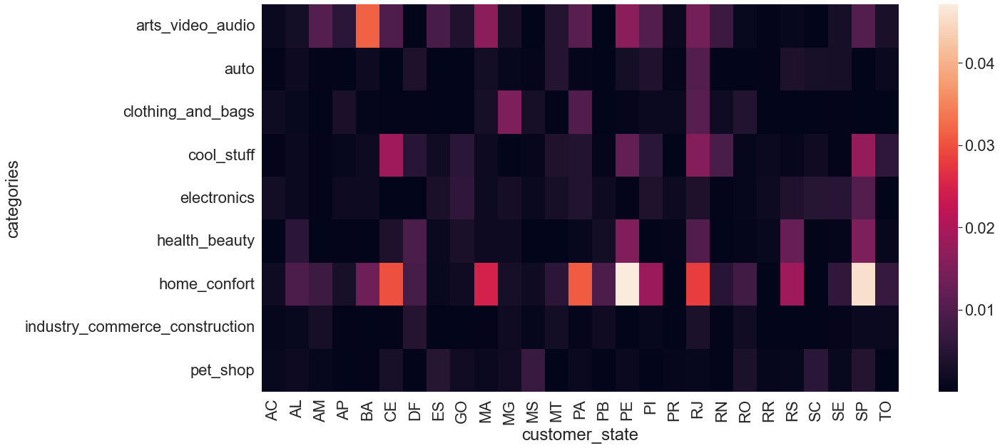

In [25]:
qualiqualinorm(dat, 'categories', 'customer_state', piv=0, fig = 1, poli = 2, heat = 1, size2 = (20, 10))

In [26]:
dat['categories'].unique()

array(['cool_stuff', 'pet_shop', nan, 'home_confort', 'health_beauty',
       'electronics', 'industry_commerce_construction',
       'arts_video_audio', 'clothing_and_bags', 'auto'], dtype=object)

In [27]:
dyt = dat.dropna(subset=['categories'])

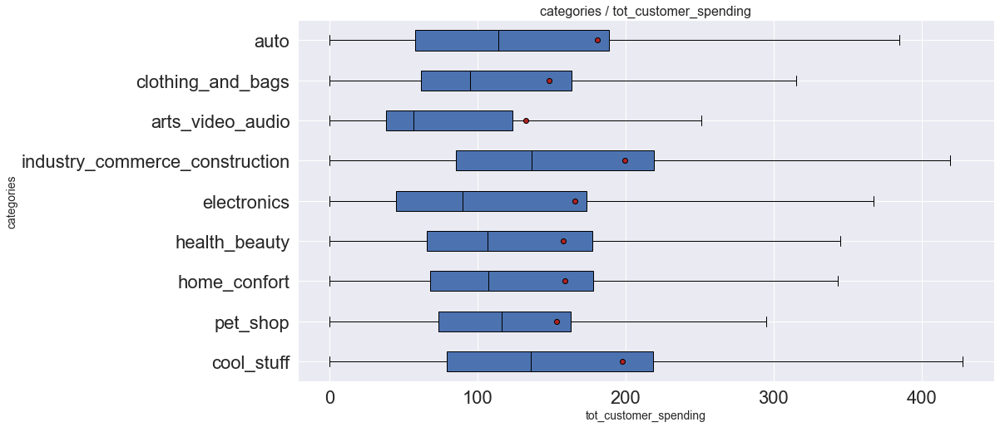

                   sum_sq       df          F         PR(>F)
C(catquali)  3.349768e+07      8.0  81.411958  6.618368e-135
Residual     4.784960e+09  93034.0        NaN            NaN


In [28]:
boxplots(dyt, 'categories', 'tot_customer_spending', tukey=0, size=(15,8), showfliers=False, sort = 0)

In [29]:
list(dorder['categories'].unique())

['cool_stuff',
 'pet_shop',
 nan,
 'home_confort',
 'health_beauty',
 'electronics',
 'industry_commerce_construction',
 'arts_video_audio',
 'clothing_and_bags',
 'auto']

In [30]:
#Categories as 1-2-3-etc
alpha_cats = list(dorder['categories'].unique())

startt = time.time()

condition = [(dorder['categories'] == alpha_cats[0]), (dorder['categories'] == alpha_cats[1]),
             (dorder['categories'] == alpha_cats[3]), (dorder['categories'] == alpha_cats[4]),
             (dorder['categories'] == alpha_cats[5]), (dorder['categories'] == alpha_cats[6]),
             (dorder['categories'] == alpha_cats[7]), (dorder['categories'] == alpha_cats[8]),
             (dorder['categories'] == alpha_cats[9])           
]

choice = [1, 2, 3, 4, 5, 6, 7, 8, 9] 

dorder['alpha_cats'] = np.select(condlist= condition, choicelist=choice, default = 0)
          
endt = time.time()
print("total time: ",(endt - startt),"sec")

total time:  0.04150676727294922 sec


<a id='satis' />

## Satisfaction criterium

In [31]:
fig = px.histogram(dat['Cus_mean_review_score'],
            marginal="box",
            width=600,
            height=400
        )
fig.show()

In [32]:
dat['Cus_mean_review_score'].isna().mean()*100

0.7362522114050234

In [33]:
dat['Cus_mean_review_score'].describe()

count    93702.000000
mean         4.130954
std          1.300793
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: Cus_mean_review_score, dtype: float64

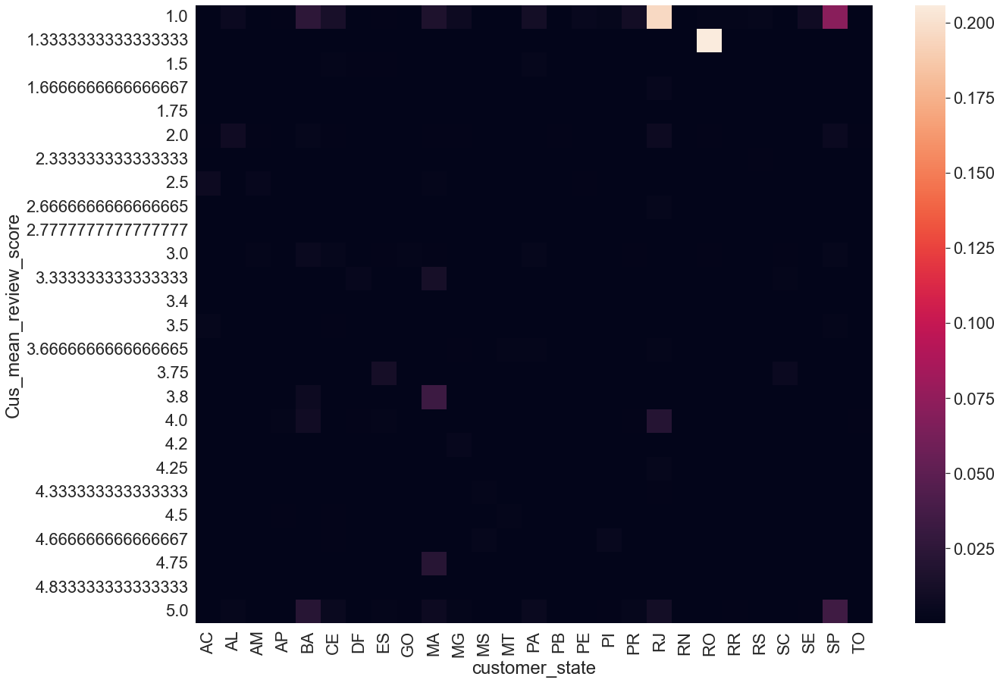

In [34]:
qualiqualinorm(dat, 'Cus_mean_review_score', 'customer_state', piv=0, fig = 0, poli = 2, heat = 1, size2 = (20, 15))

In [35]:
rev1 = dorder[dorder['payment_sequential'] == 1]
rev2 = rev1[rev1['order_item_id'] == 1]
reviews_five = rev2[rev2['review_score'] == 5]

print('totel orders with no comment title :', len(rev2[rev2['review_comment_title'] == 'Unknown'])/rev2.shape[0]*100)
print('--'*5)
print('totel orders with no comment text :', len(rev2[rev2['review_comment_message'] == 'None'])/rev2.shape[0]*100)
print('--'*5)
print('5* with no comment title :', len(reviews_five[reviews_five['review_comment_title'] == 'Unknown'])/rev2.shape[0]*100)
print('--'*5)
print('5* with no comment text :', len(reviews_five[reviews_five['review_comment_message'] == 'None'])/rev2.shape[0]*100)

totel orders with no comment title : 88.43796216023254
----------
totel orders with no comment text : 59.517568463460655
----------
5* with no comment title : 51.515120607884135
----------
5* with no comment text : 37.40119332959355


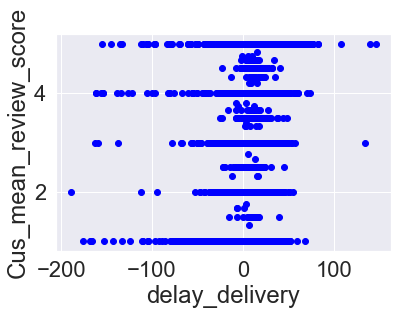

In [36]:
quantiquanti(dat, 'delay_delivery', 'Cus_mean_review_score', regl = 0, co = 0)

#### Most of the 1* comments are coming from the big cities / more than 50% of the comments are 5* but it also shows that customers who are giving a 5* rating to their transaction have a higher rate of comments

<a id='acess' />

## Accessibility criterium

In [37]:
dorder[['delay_delivery']].describe()

,delay_delivery
count,115712.000000
mean,11.351856
std,10.160706
min,-188.933414
25%,6.507497
50%,12.056939
75%,16.315359
max,145.974456


In [38]:
fig = px.histogram(dat['delay_delivery'],
            marginal="box",
            width=800,
            height=400
        )
fig.show()

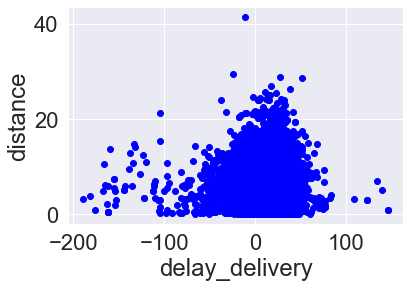

In [39]:
quantiquanti(dorder, 'delay_delivery', 'distance', regl = 0, co = 0)

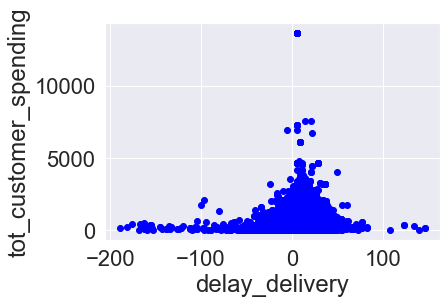

In [40]:
quantiquanti(dorder, 'delay_delivery', 'tot_customer_spending', regl = 0, co = 0)

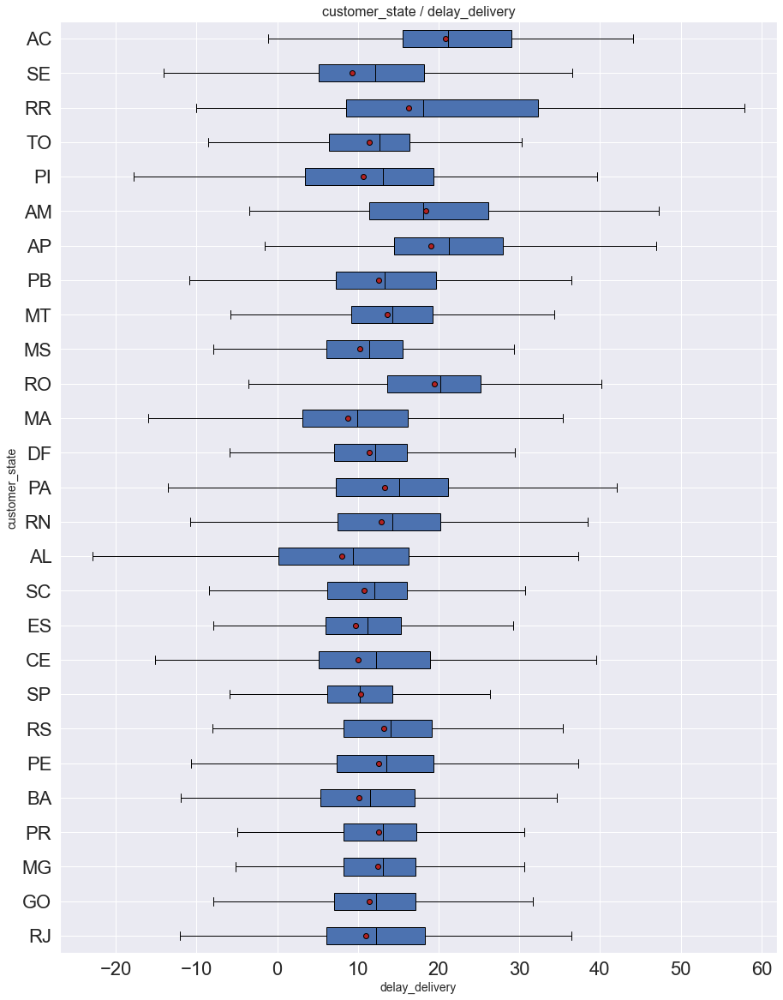

                   sum_sq       df          F         PR(>F)
C(catquali)  1.470871e+05     26.0  55.292542  5.443345e-285
Residual     9.545378e+06  93295.0        NaN            NaN


In [41]:
boxplots(dat, 'customer_state', 'delay_delivery', tukey=0, size=(15,20), showfliers=False, sort = 0)

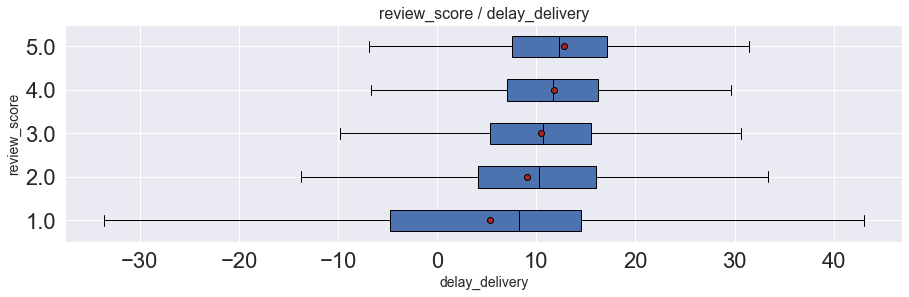

                   sum_sq        df            F  PR(>F)
C(catquali)  6.399049e+05       4.0  1660.784015     0.0
Residual     1.106263e+07  114846.0          NaN     NaN


In [42]:
boxplots(dorder.dropna(subset = ['review_score']), 'review_score', 'delay_delivery', tukey=0, size=(15,4), showfliers=False, sort = 1)

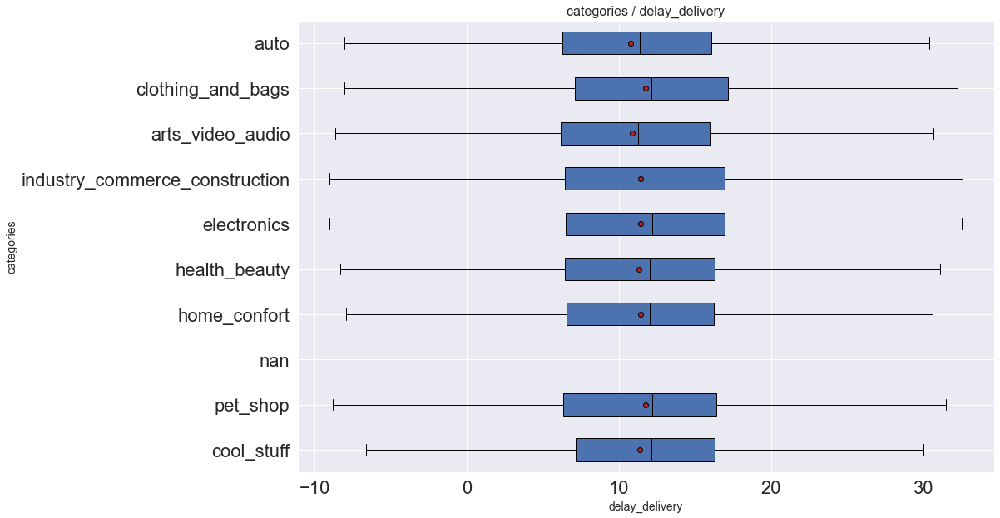

                   sum_sq        df         F        PR(>F)
C(catquali)  4.951175e+03       8.0  5.999697  9.928614e-08
Residual     1.176397e+07  114042.0       NaN           NaN


In [43]:
boxplots(dorder, 'categories', 'delay_delivery', tukey=0, size=(15,10), showfliers=False, sort = 0)

#### The delay doesn't show so much correlations to either the price (We should look futher in details {the freight value could be more significant} or the distance but play a part in the customer review_score (i.e : the cus_mean_score)

<a id='pay' /> 

## Means of payment

In [59]:
dorder.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,distance,geo_mlat_customer,geo_mlng_customer,seller_zip_code_prefix,seller_city,seller_state,geo_mlat_seller,geo_mlng_seller,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,Time_of_purchase,Time_of_purchase_sec,Number_of_orders,First_order_time,Last_order_time,Recency,Frequency,total_payment_value,tot_customer_spending,mean_review_score,order_delivered_time,order_estimated_delivery,delay_delivery,categories,Number_of_articles,mean_spending,Most_used_method_of_payment,Method_used_to_spend_the_most,MUM_of_payment_a,MU_to_spend_the_most_a,Preferred category,cool_stuff,pet_shop,home_confort,health_beauty,electronics,industry_commerce_construction,arts_video_audio,clothing_and_bags,auto,alpha_cats,Cus_mean_review_score
0,00010242fe8c5a6d1ba2dd792cb16214,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,1.0,credit_card,2.0,72.19,97ca439bc427b48bc1cd7177abe71365,5.0,Unknown,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,2.945252,-21.762775,-41.309633,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,621.290995,53679542.0,1,53679542,53679542,355.005498,1.0,72.19,72.19,5.0,628.905417,636.916667,8.011250,cool_stuff,1,72.19,credit_card,credit_card,1,1,cool_stuff,1,0,0,0,0,0,0,0,0,1,5.0
1,130898c0987d1801452a8ed92a670612,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,1.0,boleto,1.0,73.86,b11cba360bbe71410c291b764753d37f,5.0,Unknown,"lannister como sempre, entregou certinho e dentro do prazo. recomendo muito",2017-07-14 00:00:00,2017-07-17 12:50:07,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO,7.887528,-17.884337,-51.716990,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,544.411343,47037140.0,1,47037140,47037140,431.885150,1.0,73.86,73.86,5.0,559.777419,571.916667,12.139248,cool_stuff,1,73.86,boleto,boleto,2,2,cool_stuff,1,0,0,0,0,0,0,0,0,1,5.0
2,532ed5e14e24ae1f0d735b91524b98b9,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,1.0,credit_card,2.0,83.23,af01c4017c5ab46df6cc810e069e654a,4.0,super recomendo,carrinho muito bonito,2018-06-05 00:00:00,2018-06-06 21:41:12,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG,1.614209,-19.914323,-43.975703,27277.0,volta redonda,SP,-22.496953,-44.127492,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff,868.351308,75025553.0,1,75025553,75025553,107.945185,1.0,83.23,83.23,4.0,885.690579,887.916667,2.226088,cool_stuff,1,83.23,credit_card,credit_card,1,1,cool_stuff,1,0,0,0,0,0,0,0,0,1,4.0
3,6f8c31653edb8c83e1a739408b5ff750,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,1.0,credit_card,3.0,75.07,8304ff37d8b16b57086fa283fe0c44f8,5.

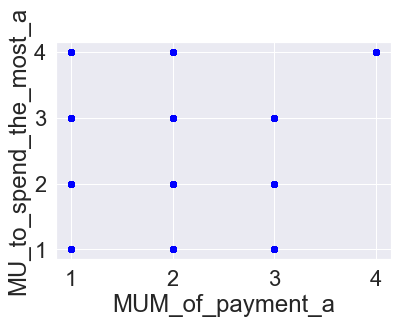

In [64]:
quantiquanti(dorder, 'MUM_of_payment_a', 'MU_to_spend_the_most_a', regl = 0, co = 0)

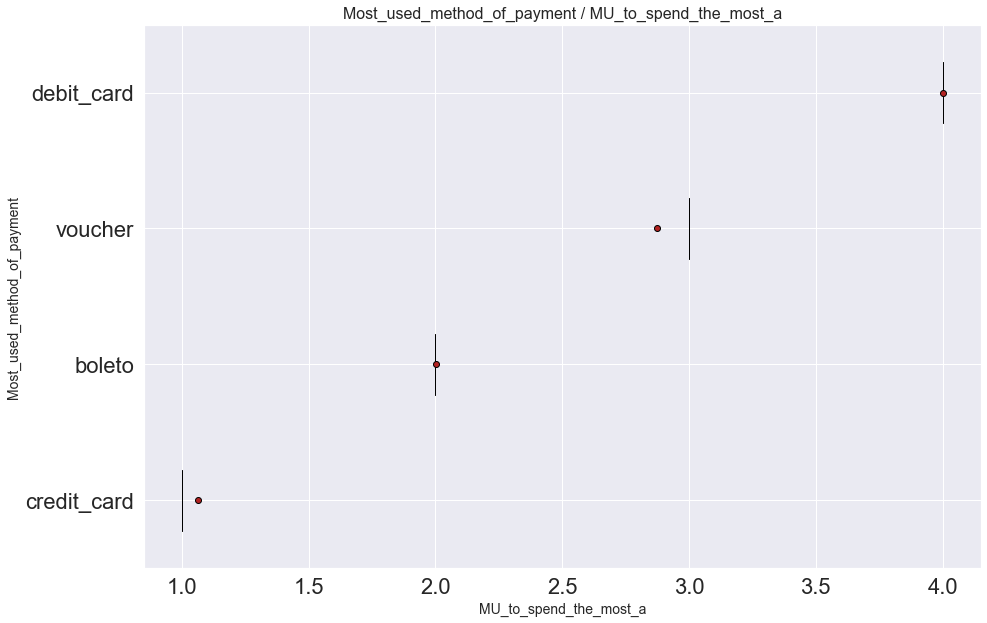

                   sum_sq        df              F  PR(>F)
C(catquali)  38997.010184       3.0  129693.919907     0.0
Residual     11723.806537  116971.0            NaN     NaN


In [66]:
boxplots(dorder, 'Most_used_method_of_payment', 'MU_to_spend_the_most_a', tukey=0, size=(15,10), showfliers=False, sort = 0)

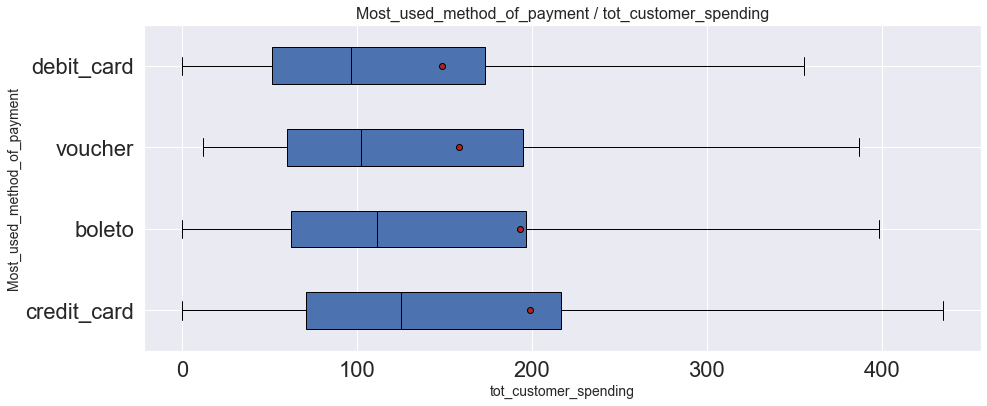

                   sum_sq        df          F        PR(>F)
C(catquali)  1.111105e+07       3.0  42.606466  1.651532e-27
Residual     1.016802e+10  116971.0        NaN           NaN


In [68]:
boxplots(dorder, 'Most_used_method_of_payment', 'tot_customer_spending', tukey=0, size=(15,6), showfliers=False, sort = 0)

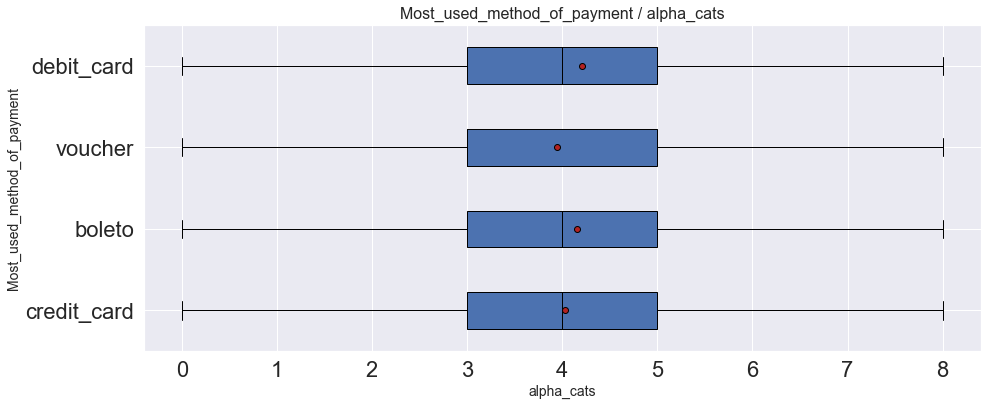

                    sum_sq        df          F        PR(>F)
C(catquali)     395.502893       3.0  28.331969  2.639869e-18
Residual     544289.381450  116971.0        NaN           NaN


In [69]:
boxplots(dorder, 'Most_used_method_of_payment', 'alpha_cats', tukey=0, size=(15,6), showfliers=False, sort = 0)